# Dynamic Time Series Analysis

In this notebook a dynamic time series analysis of satellite data will be performed

In [34]:
#import general packages
import numpy as np
import importlib
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

# set plotting to unique style
sb.set_theme(style="ticks")
sb.set_context("paper")

#import analysis packages
import ipympl
from scipy.signal import periodogram 

# import state space models package
import statsmodels.api as sm

#import custom functions
from custom_functions import data_split, UCM 
importlib.reload(UCM)
importlib.reload(data_split)

%matplotlib widget


### Create dictionary to store data in

In [65]:
# Template for each site
site_template = {
    "raw": None,
    "train_period":[],
    "test_period":[],
    "train": None,
    "test": None,
    "model_settings":{},
    "model_performance":{},
    "results": {},
    "forecasts": {},
    "train_residuals":{},
    "test_residuals":{}
}

# VAriables
variables = ['Soil_moisture']

# List of sites
Soil_moisture_sites = ["Zhurucay", "Quinuas", "6120191830", "6120208780", 
                       "6120254390", "6120288400","6121039290","6121047290",
                       "6121051790","6121064220"]

# Create the main dictionary for Soil moisture
analysis_overview= {var: {site: site_template.copy() for site in Soil_moisture_sites} for var in variables}

## Load the data

In [67]:
# Load the data into a dataframe and append to dict
SM_data = pd.read_csv("../../data/shapefiles/SM_selectedwatersheds_model.csv")
SM_data['date'] = pd.to_datetime(SM_data['date'],format='%Y-%m-%d',errors='coerce')
SM_data.set_index('date', inplace=True)



# Loop through each site in your site list
for site in Soil_moisture_sites:
    if site in SM_data.columns:
        analysis_overview['Soil_moisture'][site]['raw'] = SM_data[site]
    else:
        print(f"Warning: {site} not found in SM_data columns.")

plot SM datasets

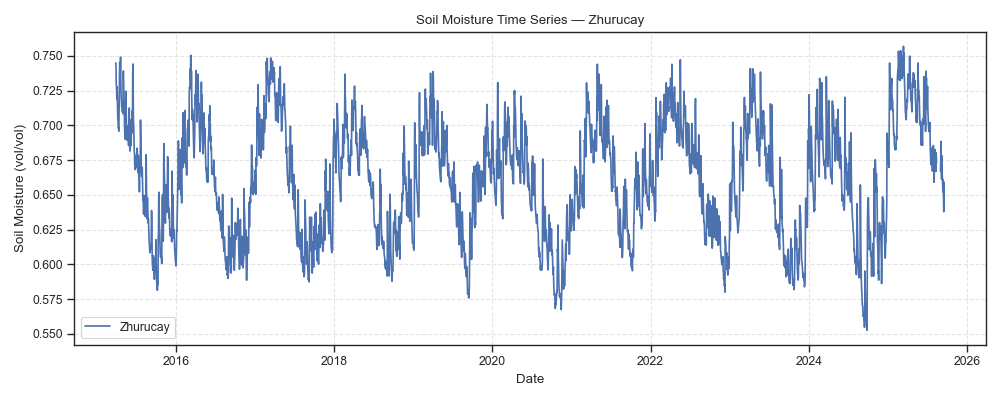

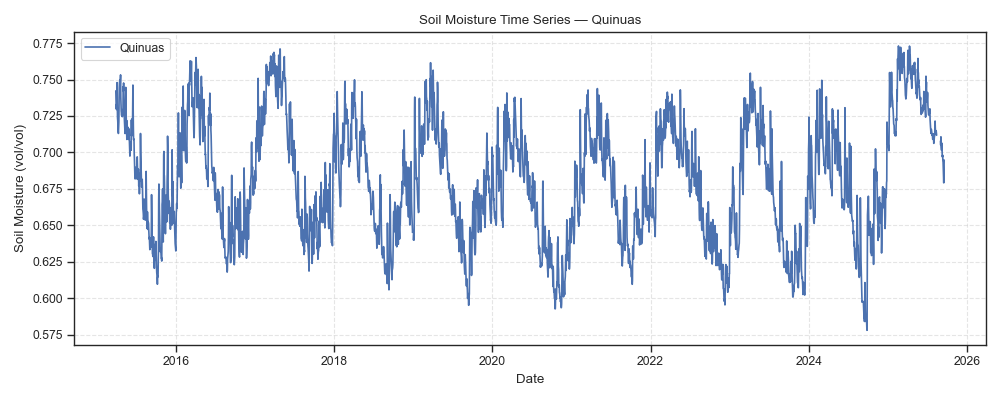

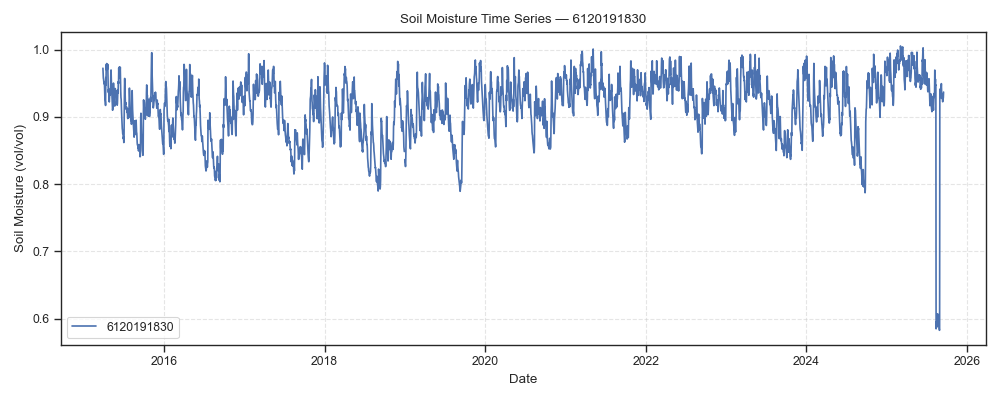

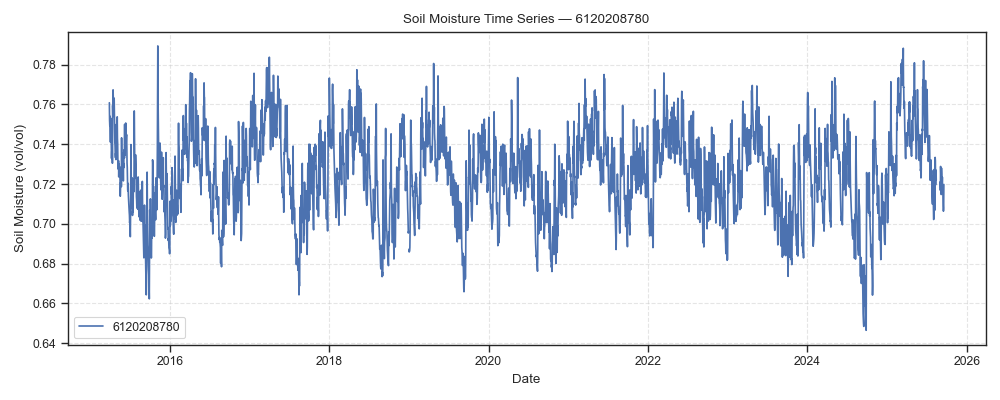

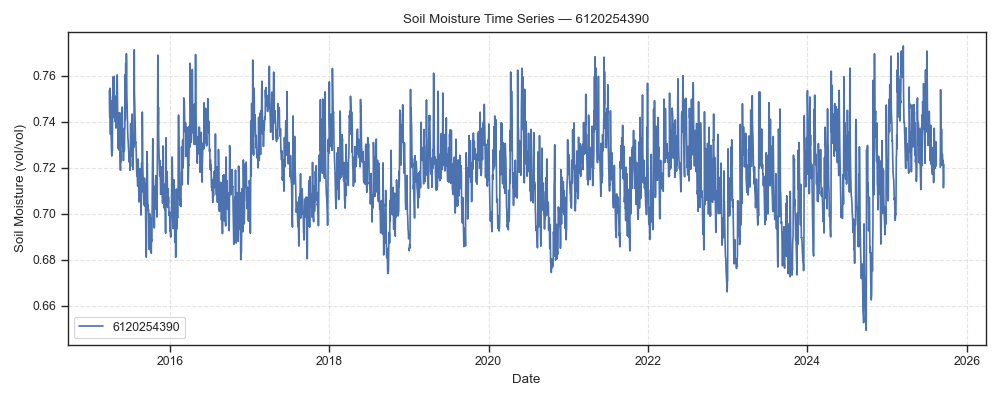

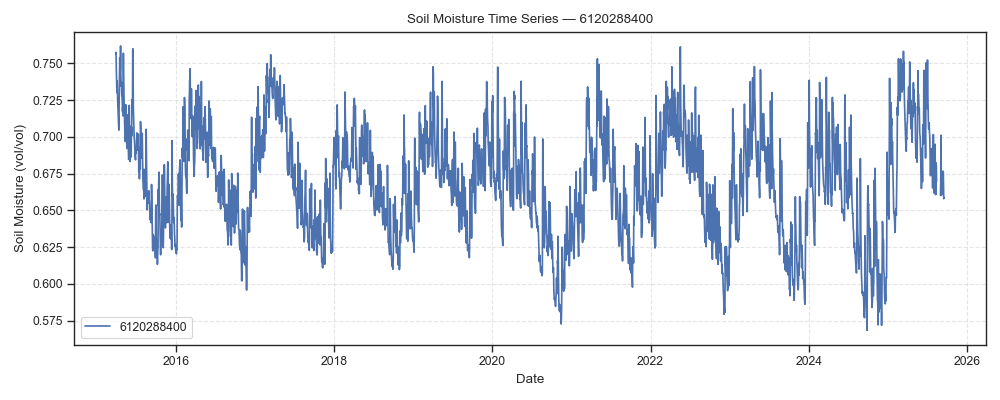

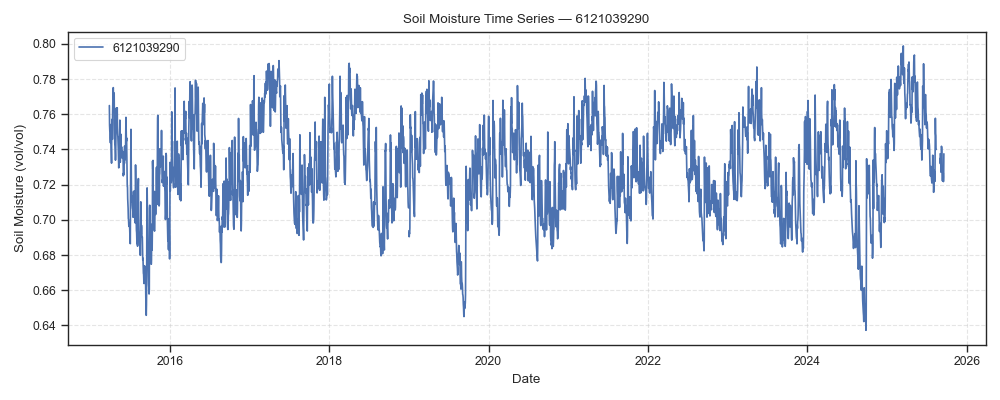

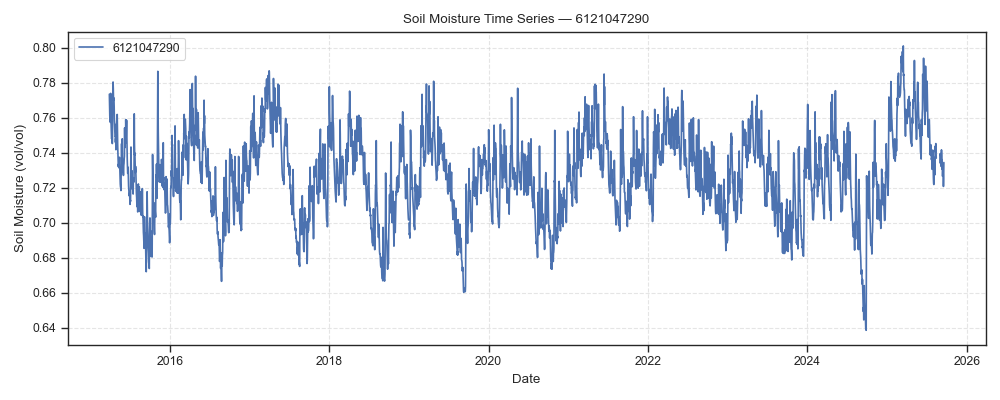

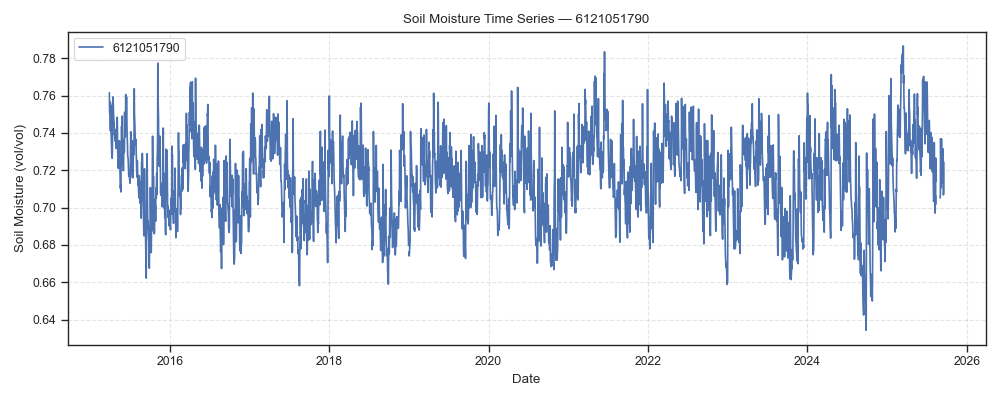

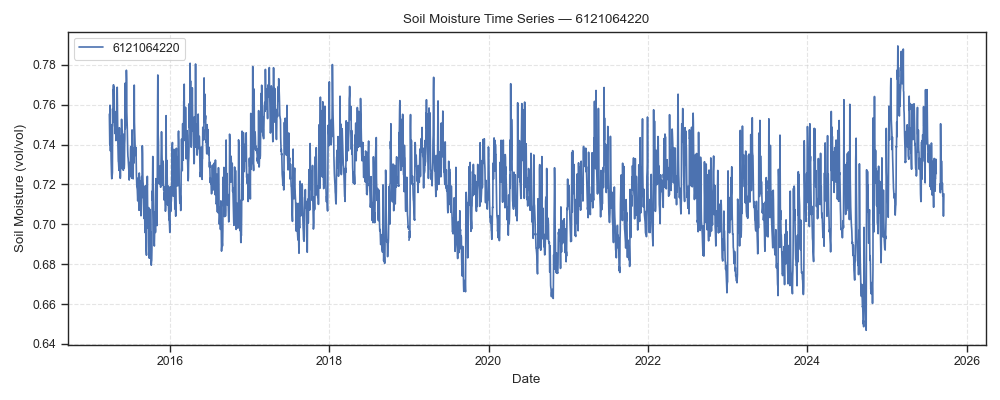

In [68]:
# Loop through all sites
for site in Soil_moisture_sites:
    data = analysis_overview['Soil_moisture'][site]['raw']
    
    # Skip empty data
    if data is None or data.empty:
        print(f"⚠️ Skipping {site} (no data)")
        continue
    
    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(data.index, data.values, label=f"{site}", color="C0")
    plt.title(f"Soil Moisture Time Series — {site}")
    plt.xlabel("Date")
    plt.ylabel("Soil Moisture (vol/vol)")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Clean and divide main dataset

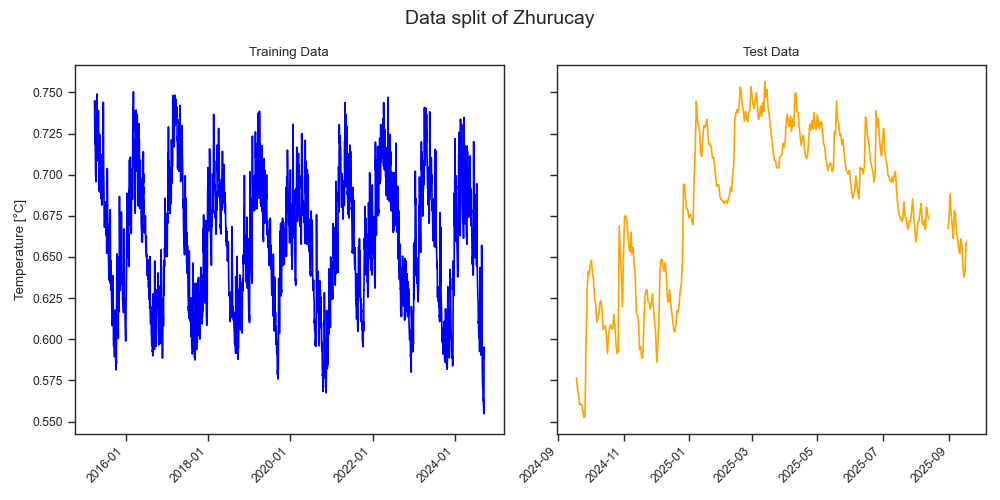

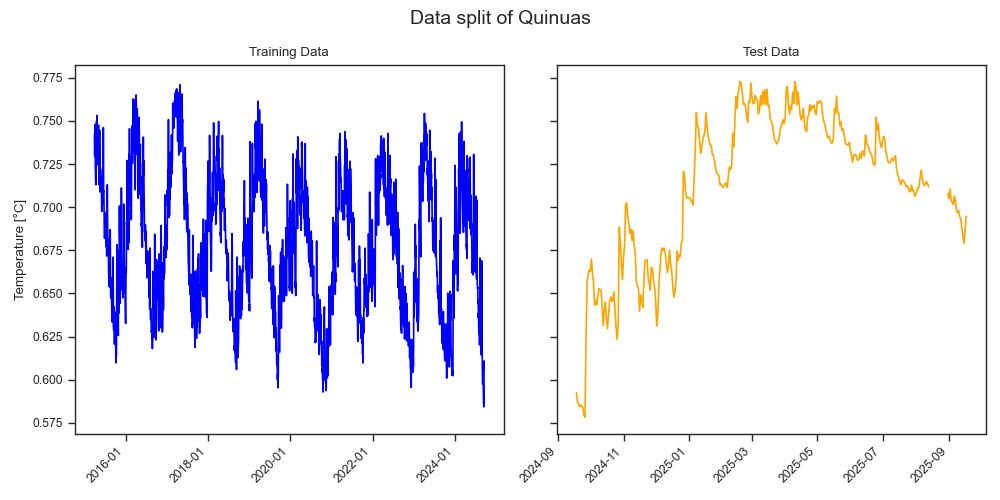

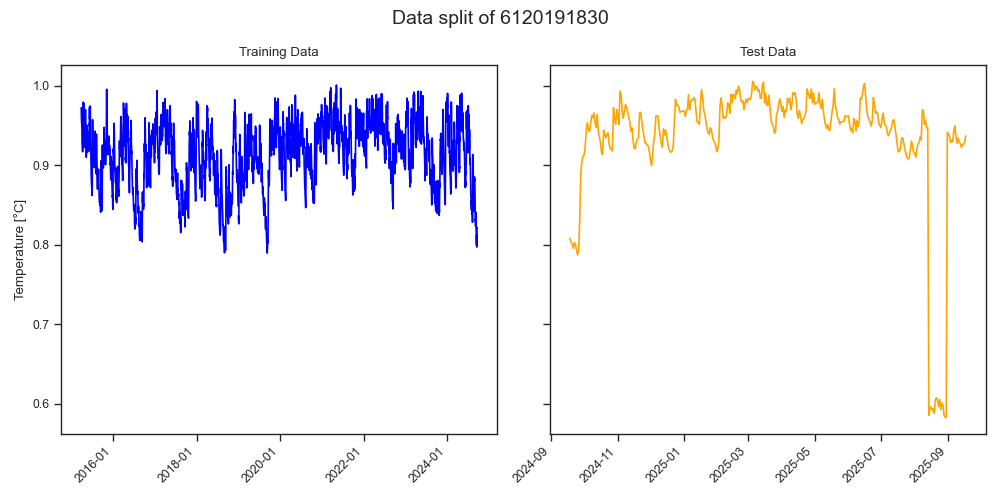

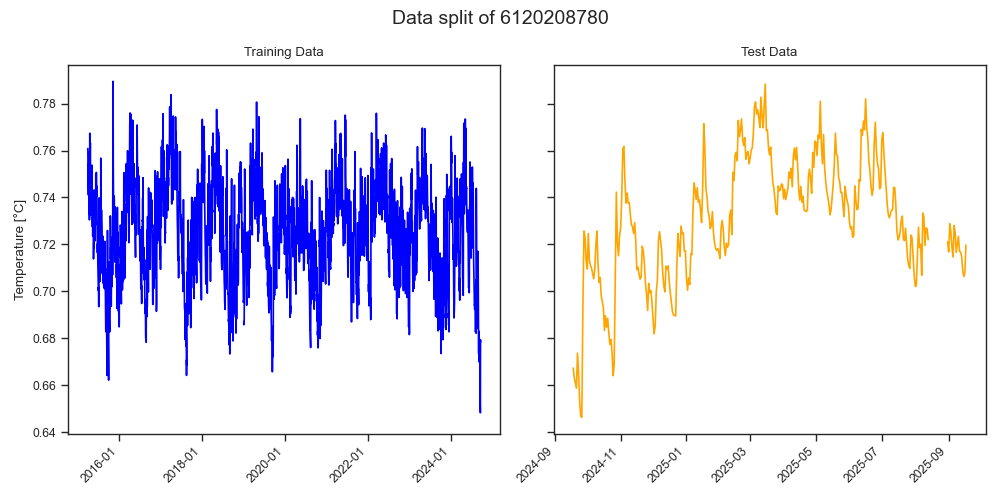

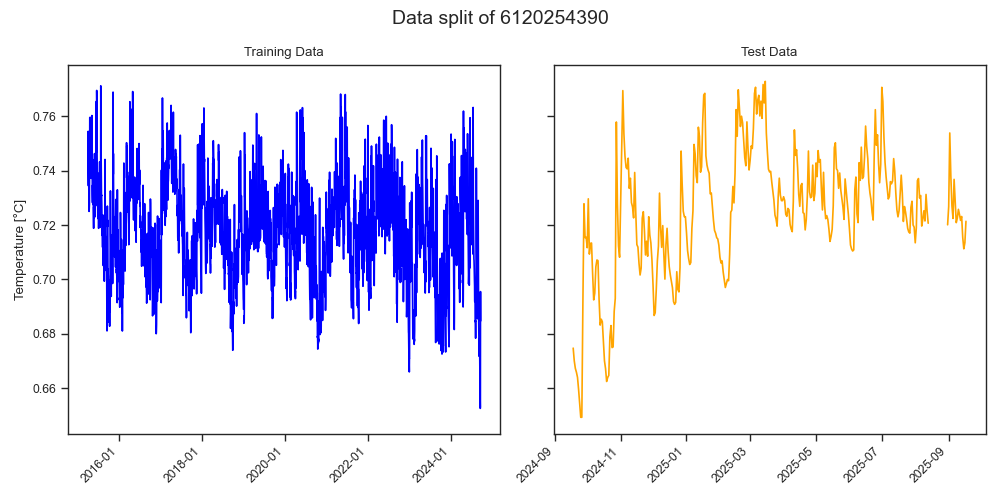

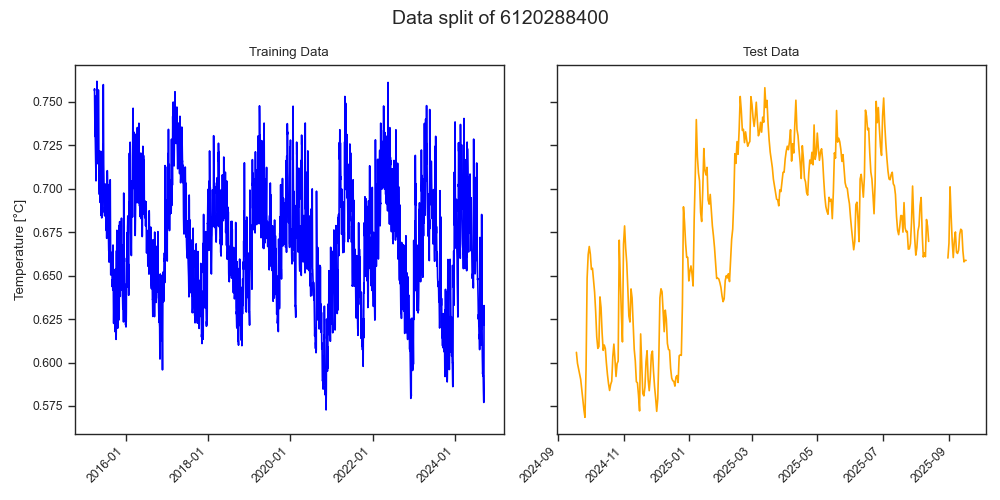

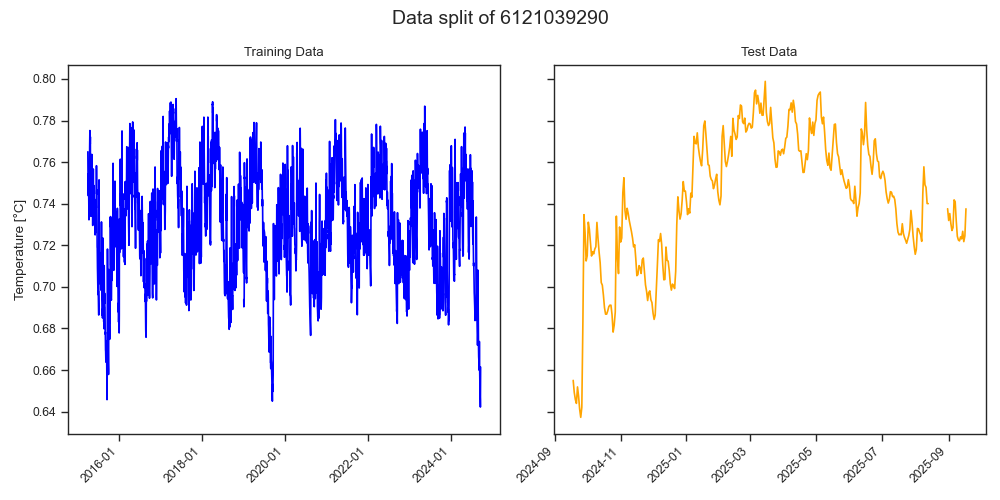

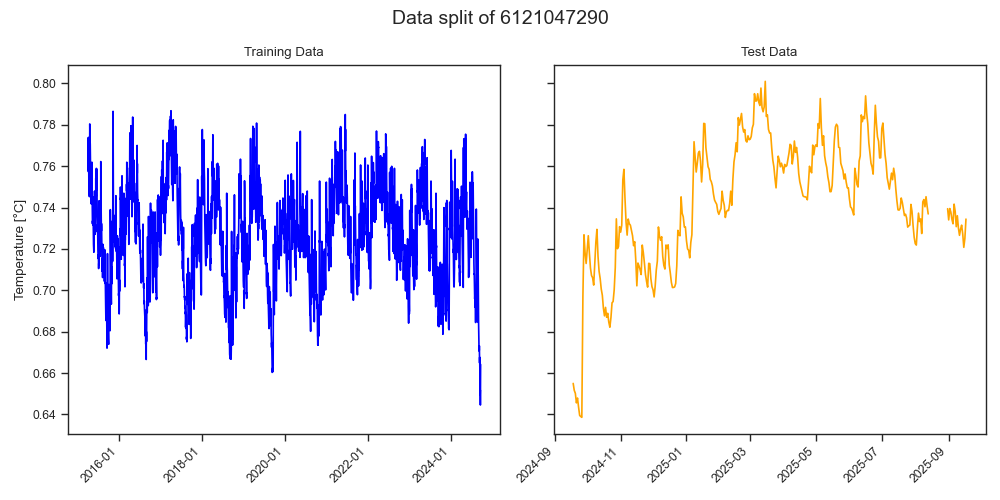

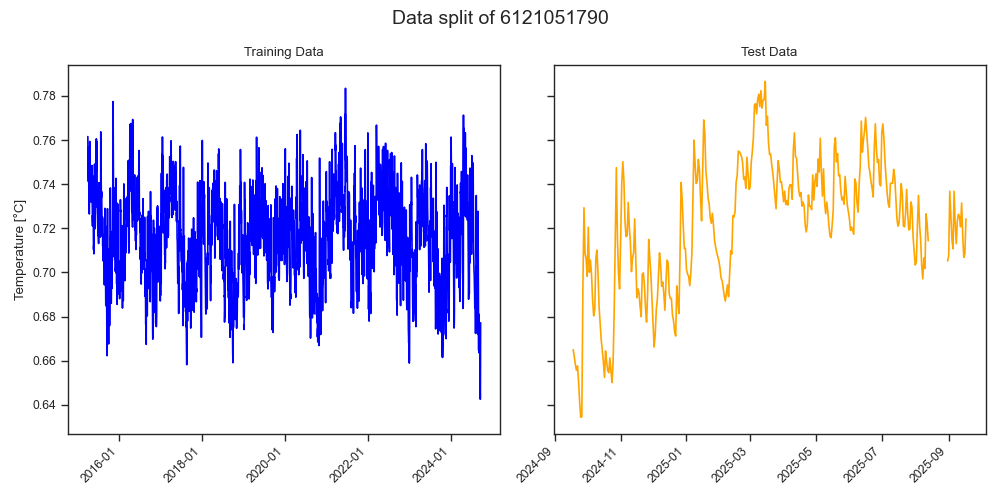

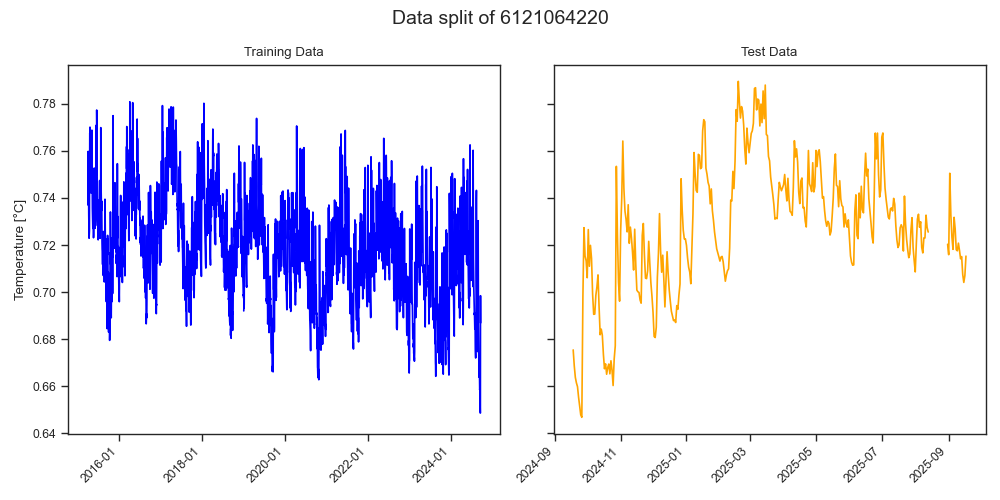

In [70]:
splitters = {}

importlib.reload(data_split)
for site in Soil_moisture_sites:
    df = analysis_overview['Soil_moisture'][site]['raw']
    if df is None:
        continue

    splitter = data_split.DataSplitter(df, station_name=site)
    
    # Automatically compute train/test periods
    periods = splitter.compute_train_test_periods(min_test_days=365)
    
    # Split the data
    splitter.split(periods['train_start'], periods['train_end'],
                   periods['test_start'], periods['test_end'])
    splitter.plot()
    
    # Store in main dict
    analysis_overview['Soil_moisture'][site].update({
        'train_period': [periods['train_start'], periods['train_end']],
        'test_period': [periods['test_start'], periods['test_end']],
        'train': splitter.train_data,
        'test': splitter.test_data,
        'splitter': splitter
    })


## Model creation, refinement and forecasting

In [71]:
def fit_forecast_model(station, model, analysis_overview, exog_vars_future=None, n_bins=None):

    # Fit the model
    _, test_stat = model.fit()
    
    #plot diagnostics
    model.diagnostics()
    
    #Forcast the model
    if n_bins is not None:
        n_bins = 6
    fitted, forecast, residuals = model.forecast(bins=n_bins, exog_future=exog_vars_future)

    #print(f"residuals: {residuals}")

    # Plot results
    model.plot_results(plot_trend=False)
    
    # # Report scores
    # model_scores = model.report_scores()

    # Append to dict
    analysis_overview['Soil_moisture'][station].update({ 'results':fitted,
                                        'model_settings':model.model_settings,
                                        'model_performance': test_stat,
                                        'forecast':forecast,
                                        'train_residuals':residuals['train_residuals'],
                                        'test_residuals':residuals['test_residuals']})

### Zhurucay

In [72]:
#Load in possible regressors
regressors_Zhurucay = {}
Precipitation = pd.read_csv("../../data/Zhurucay/Metereological/Zhurucay_daily_sum_Rain_mm_Tot.csv")
Precipitation['TIMESTAMP'] = pd.to_datetime(Precipitation['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
Precipitation.set_index('TIMESTAMP', inplace=True)
Precipitation = Precipitation.fillna(method='ffill')
regressors_Zhurucay["Precipitation"] = Precipitation

RH = pd.read_csv("../../data/Zhurucay/Metereological/Zhurucay_daily_mean_RH.csv")
RH['TIMESTAMP'] = pd.to_datetime(RH['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
RH.set_index('TIMESTAMP', inplace=True)
RH = RH.fillna(method='ffill')
regressors_Zhurucay["Relative humidity"] = RH

SlrkW = pd.read_csv("../../data/Zhurucay/Metereological/Zhurucay_daily_mean_SlrkW_2_Avg.csv")
SlrkW['TIMESTAMP'] = pd.to_datetime(SlrkW['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
SlrkW.set_index('TIMESTAMP', inplace=True)
SlrkW = SlrkW.fillna(method='ffill')
regressors_Zhurucay["Solar radiation"] = SlrkW

Temp = pd.read_csv("../../data/Zhurucay/Metereological/Zhurucay_daily_mean_AirTC_Avg.csv")
Temp['TIMESTAMP'] = pd.to_datetime(Temp['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
Temp.set_index('TIMESTAMP', inplace=True)
Temp = Temp.fillna(method='ffill')
regressors_Zhurucay["Temperature"] = Temp

WS = pd.read_csv("../../data/Zhurucay/Metereological/Zhurucay_daily_mean_WS_ms_Avg.csv")
WS['TIMESTAMP'] = pd.to_datetime(WS['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
WS.set_index('TIMESTAMP', inplace=True)
WS = WS.fillna(method='ffill')
regressors_Zhurucay["Wind speed"] = WS


# Plot regressor data Zhurucay
# for variable, data in regressors_Zhurucay.items():
#     plt.plot(data.index, data, label = variable)
#     plt.title(f"Overview of {variable} data at Zhurucay")
#     plt.legend()
#     plt.show()

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2830152664.py:6: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  Precipitation = Precipitation.fillna(method='ffill')
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2830152664.py:12: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  RH = RH.fillna(method='ffill')
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2830152664.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  SlrkW = SlrkW.fillna(method='ffill')
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2830152664.py:24: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() ins

Make sure train, test and exxogenous datasets are over the same timeframe

In [73]:
train_begin,train_end = '2016-01-01','2020-12-31'
test_begin, test_end = '2021-01-01', '2022-01-01'

Zhur_SM_train_data = analysis_overview['Soil_moisture']['Zhurucay']['raw'].to_frame()
Zhur_SM_train_data = Zhur_SM_train_data.loc[train_begin:train_end]

Zhur_SM_test_data = analysis_overview['Soil_moisture']['Zhurucay']['raw'].to_frame()
Zhur_SM_test_data =Zhur_SM_test_data.loc[test_begin:test_end]

Precipitation_train = Precipitation.loc[train_begin:train_end]
Precipitation_test = Precipitation.loc[test_begin:test_end]

RH_train = RH.loc[train_begin:train_end]
RH_test = RH.loc[test_begin:test_end]

SlrkW_train = SlrkW.loc[train_begin:train_end]
Slrkw_test = SlrkW.loc[test_begin:test_end]

Temp_train = Temp.loc[train_begin:train_end]
Temp_test = Temp.loc[test_begin:test_end]

WS_train = WS.loc[train_begin:train_end]
WS_test = WS.loc[test_begin:test_end]



Create exxogenous dataframe and cross correlate

In [74]:
# Define exxogenous parameters
exog_vars = pd.concat([Precipitation_train], axis=1)
exog_vars.resample('W').sum()
exog_vars_future = pd.concat([Precipitation_test], axis=1)
exog_vars_future.resample('W').sum()

# Print the correlation between them
print(exog_vars.corr())

             Rain_mm_Tot
Rain_mm_Tot          1.0


Run the model

c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['stochast_freq_seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269BDD146D0>
                                Unobserved Components Results                                
Dep. Variable:                              Zhurucay   No. Observations:                  262
Model:                               fixed intercept   Log Likelihood                 704.267
                   + stochastic freq_seasonal(52(1))   AIC                          -1402.534
                                             + AR(1)   BIC                          -1391.864
Date:                               Fri, 31 Oct 2025   HQIC                         -1398.244
Time:                                       11:50:03                                         
Sample:                                   01-03-2016                                         
                                        - 01-03-2021                                         
Covariance Type:                                 opg     

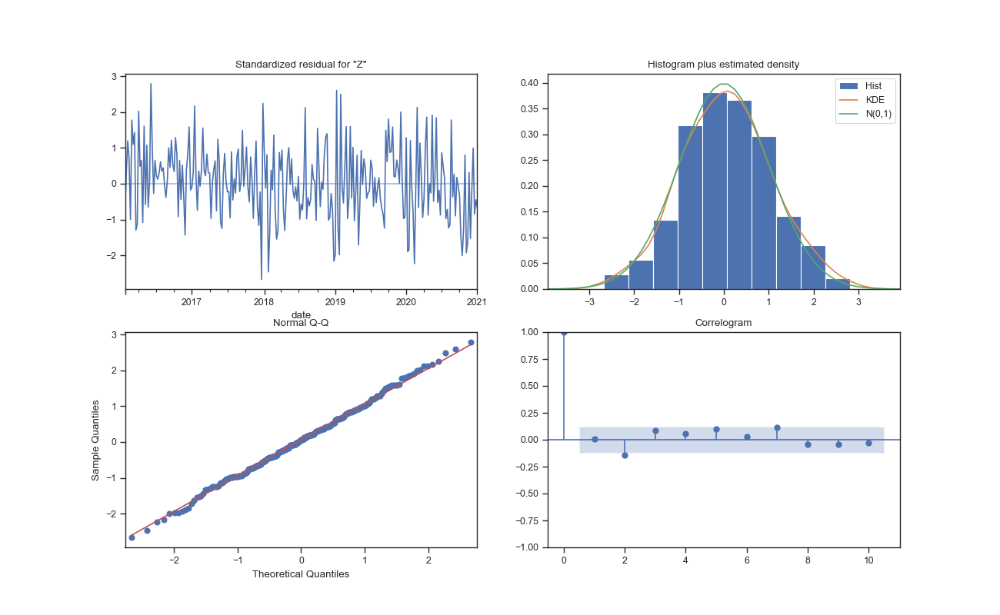

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000026991239F90>


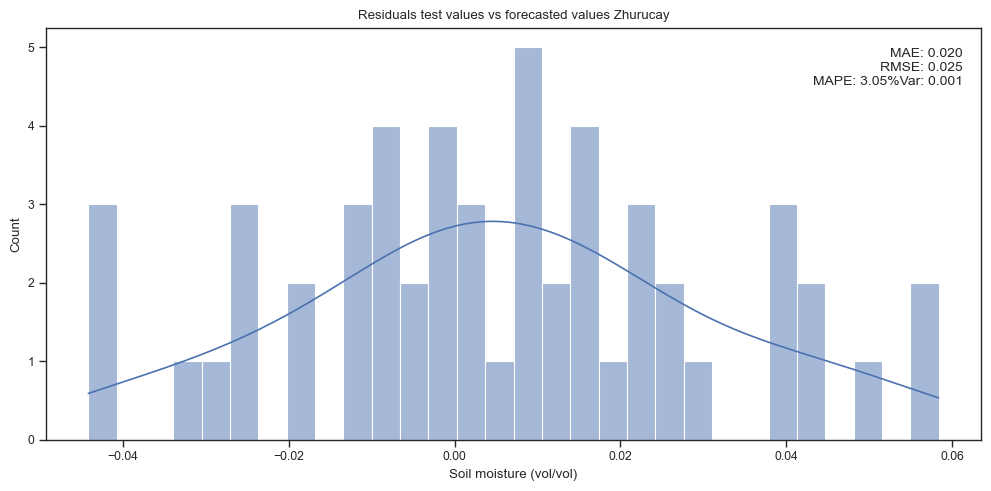

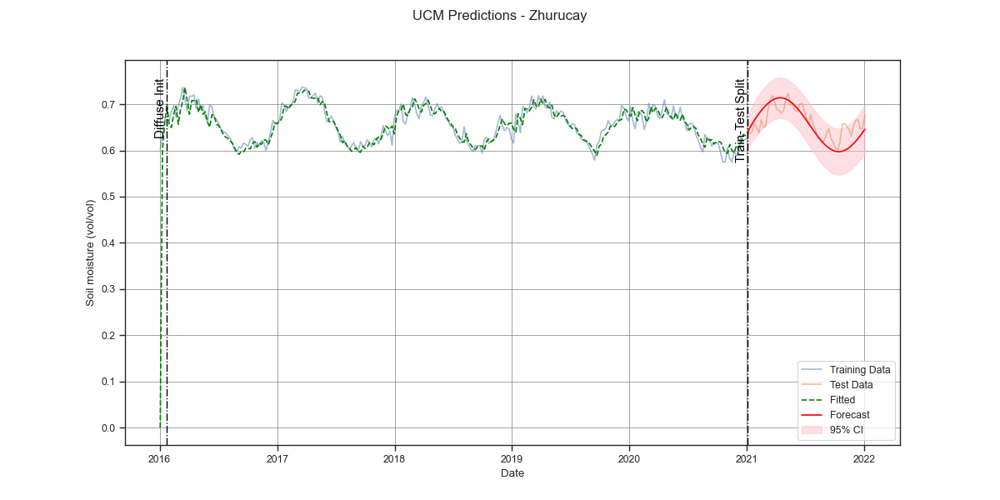

In [75]:
importlib.reload(UCM)

Zhur_SM_train_data = Zhur_SM_train_data.resample('W').mean()
Zhur_SM_test_data = Zhur_SM_test_data.resample('W').mean()

model_SM_Zhurucay = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":52,"harmonics":1}],
    'stochast_freq_seasonal':[True],
    'autoregressive':1,
} 

Zhur_SM_model = UCM.UnobservedComponentsModel(train_data= Zhur_SM_train_data,
                              model_settings= model_SM_Zhurucay,
                              station='Zhurucay',
                              unit='Soil moisture (vol/vol)',
                              test_data= Zhur_SM_test_data)


fit_forecast_model('Zhurucay', Zhur_SM_model, analysis_overview)#, exog_vars_future)

### Quinuas

In [76]:
# Load in regressors
regressors_Quinuas = {}
Precipitation = pd.read_csv("../../data/Quinuas/Metereological/Virgen_daily_sum_Rain_mm_Tot.csv")
Precipitation['TIMESTAMP'] = pd.to_datetime(Precipitation['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
Precipitation.set_index('TIMESTAMP', inplace=True)
Precipitation = Precipitation.fillna(method='ffill')
regressors_Quinuas["Precipitation"] = Precipitation

Temp = pd.read_csv("../../data/Quinuas/Metereological/Virgen_daily_mean_AirTC_Avg.csv")
Temp['TIMESTAMP'] = pd.to_datetime(Temp['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
Temp.set_index('TIMESTAMP', inplace=True)
Temp = Temp.fillna(method='ffill')
regressors_Quinuas["Temperature"] = Temp

RH = pd.read_csv("../../data/Quinuas/Metereological/Virgen_daily_mean_RH_Avg.csv")
RH['TIMESTAMP'] = pd.to_datetime(RH['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
RH.set_index('TIMESTAMP', inplace=True)
RH = RH.fillna(method='ffill')
regressors_Quinuas["Relaticve Humidity"] = RH

SlrW = pd.read_csv("../../data/Quinuas/Metereological/Virgen_daily_mean_SlrW_Avg.csv")
SlrW['TIMESTAMP'] = pd.to_datetime(SlrW['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
SlrW.set_index('TIMESTAMP', inplace=True)
SlrW = SlrW.fillna(method='ffill')
regressors_Quinuas["Solar Radiation"] = SlrW

WS = pd.read_csv("../../data/Quinuas/Metereological/Virgen_daily_mean_WS_ms_Avg.csv")
WS['TIMESTAMP'] = pd.to_datetime(WS['TIMESTAMP'],format='%Y-%m-%d',errors='coerce')
WS.set_index('TIMESTAMP', inplace=True)
WS = WS.fillna(method='ffill')
regressors_Quinuas["Solar Radiation"] = WS

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2864623527.py:6: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  Precipitation = Precipitation.fillna(method='ffill')
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2864623527.py:12: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  Temp = Temp.fillna(method='ffill')
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2864623527.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  RH = RH.fillna(method='ffill')
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\2864623527.py:24: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() inste

In [77]:
train_begin,train_end = '2017-01-01','2020-12-31'
test_begin, test_end = '2021-01-01', '2022-01-01'

Quin_SM_train_data = analysis_overview['Soil_moisture']['Quinuas']['raw'].to_frame()
Quin_SM_train_data = Quin_SM_train_data.loc[train_begin:train_end]

Quin_SM_test_data = analysis_overview['Soil_moisture']['Quinuas']['raw'].to_frame()
Quin_SM_test_data =Quin_SM_test_data.loc[test_begin:test_end]

Precipitation_train = Precipitation.loc[train_begin:train_end]
Precipitation_test = Precipitation.loc[test_begin:test_end]

Temp_train = Temp.loc[train_begin:train_end]
Temp_test = Temp.loc[test_begin:test_end]

RH_train = RH.loc[train_begin:train_end]
RH_test = RH.loc[test_begin:test_end]

SlrW_train = SlrW.loc[train_begin:train_end]
SlrW_test = SlrW.loc[test_begin:test_end]

WS_train = WS.loc[train_begin:train_end]
WS_test = WS.loc[test_begin:test_end]

In [78]:
# Define exxogenous parameters
exog_vars = pd.concat([Temp_train, Precipitation_train], axis=1)
exog_vars_future = pd.concat([Temp_test, Precipitation_test], axis=1)

# Print the correlation between them
print(exog_vars.corr())

             AirTC_Avg  Rain_mm_Tot
AirTC_Avg     1.000000    -0.037164
Rain_mm_Tot  -0.037164     1.000000


model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269836E17D0>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                               Quinuas   No. Observations:                  210
Model:                                  random trend   Log Likelihood                 564.772
                   + stochastic freq_seasonal(52(1))   AIC                          -1119.545
                                             + AR(2)   BIC                          -1102.906
Date:                               Fri, 31 Oct 2025   HQIC                         -1112.815
Time:                                       11:50:16                                         
Sample:                                   01-01-2017                                         
                                        - 01-03-2021                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

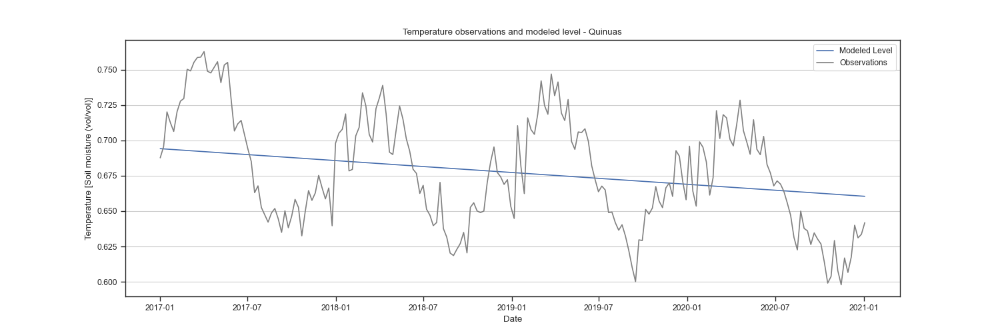

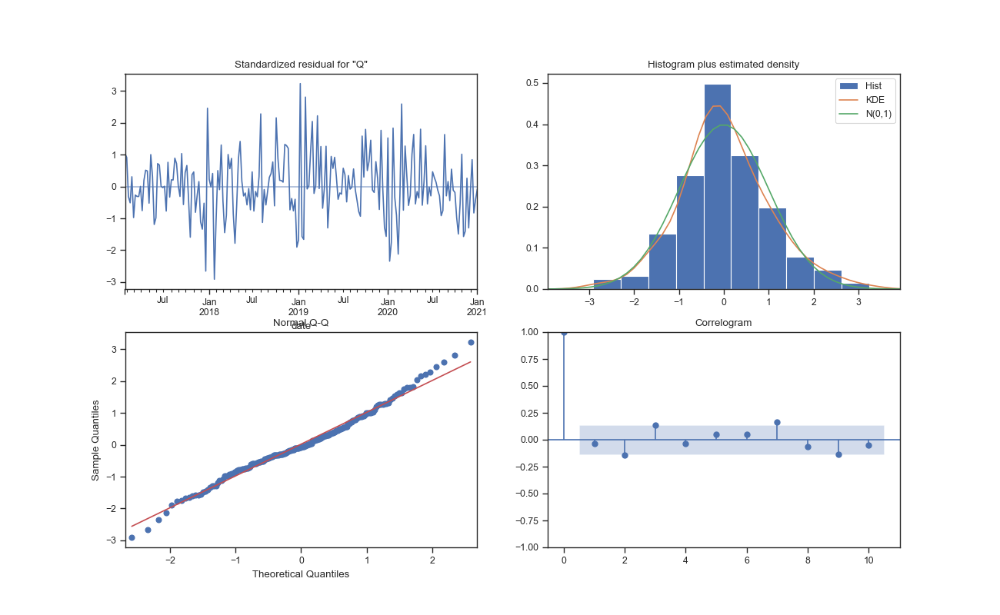

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x0000026997921F90>


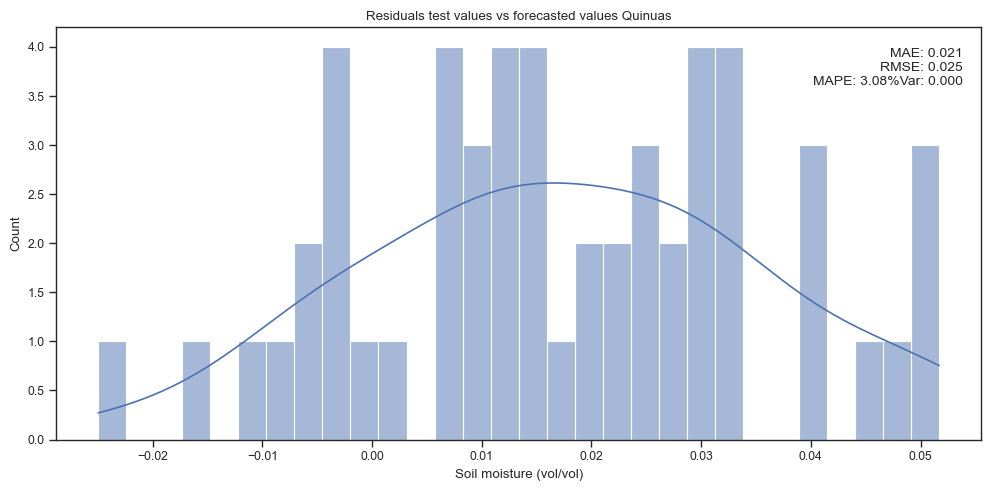

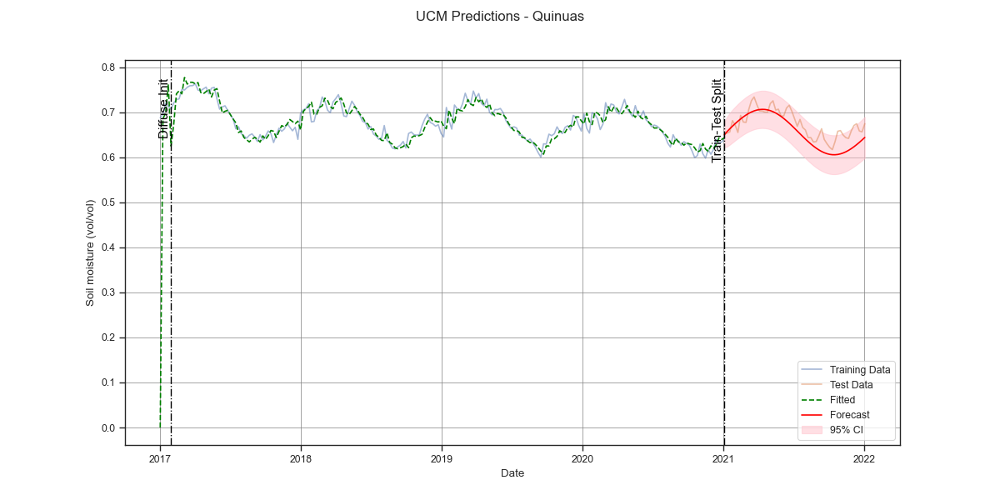

In [79]:
importlib.reload(UCM)

Quin_SM_train_data = Quin_SM_train_data.resample('W').mean()
Quin_SM_test_data = Quin_SM_test_data.resample('W').mean()

model_SM_Quinuas = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':True,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":52,"harmonics":1}],
    'autoregressive':2
    #'exog': exog_vars
}

Quin_SM_model = UCM.UnobservedComponentsModel(train_data= Quin_SM_train_data,
                              model_settings= model_SM_Quinuas,
                              station='Quinuas',
                              unit='Soil moisture (vol/vol)',
                              test_data= Quin_SM_test_data)

fit_forecast_model('Quinuas',Quin_SM_model, analysis_overview) #, exog_vars_future)

## External basins

In [80]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# --- Load the stations CSV ---
stations = pd.read_csv("../../data/external_data/Precipitation data SA/metadata/xyz.csv", encoding="latin1")

# Filter stations in Ecuador with altitude > 2000
stations_ecuador = stations[(stations['COUNTRY'] == 'ECUADOR') & (stations['ALTs'] > 1000)].reset_index(drop=True)

# --- Convert to GeoDataFrame ---
geometry = [Point(xy) for xy in zip(stations_ecuador['LON'], stations_ecuador['LAT'])]
stations_gdf = gpd.GeoDataFrame(stations_ecuador, geometry=geometry, crs="EPSG:4326")  # WGS84

# --- Load shapefiles ---
watersheds = gpd.read_file("../../data/shapefiles/HydroBASINS_shapefile.shp")
countries = gpd.read_file("../../data/external_data/Satellite_data/ne_110m_admin_0_countries.shp")
ecuador = countries[countries["ADMIN"] == "Ecuador"]

# Ensure same CRS for all
if ecuador.crs != watersheds.crs:
    watersheds = watersheds.to_crs(ecuador.crs)
if ecuador.crs != stations_gdf.crs:
    stations_gdf = stations_gdf.to_crs(ecuador.crs)

# Reproject to UTM for accurate distance calculation
watersheds_utm = watersheds.to_crs(epsg=32717)
stations_utm = stations_gdf.to_crs(epsg=32717)

# Build spatial index for stations
station_sindex = stations_utm.sindex

from shapely.ops import nearest_points

nearest_station_ids = []
distances = []

for basin in watersheds_utm.geometry:
    # Get the nearest point in stations_utm to the basin centroid
    centroid = basin.centroid
    nearest_geom = nearest_points(centroid, stations_utm.unary_union)[1]  # returns the station geometry
    # Find the index of that geometry in stations_utm
    nearest_idx = stations_utm.geometry.sindex.query(nearest_geom)[0]
    
    nearest_station_ids.append(nearest_idx)
    # Compute distance
    distances.append(float(centroid.distance(stations_utm.geometry.iloc[nearest_idx])))

# Add to the GeoDataFrame with correct dtypes
watersheds_utm["nearest_station_id"] = pd.Series(nearest_station_ids, dtype=int)
watersheds_utm["distance_to_station_m"] = pd.Series(distances, dtype=float)

# --- Merge station info ---
watersheds_with_stations = watersheds_utm.merge(
    stations_utm[["ID", "NAME", "geometry"]],
    left_on="nearest_station_id",
    right_index=True,
    suffixes=("", "_station")
)

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_39124\357320956.py:42: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  nearest_geom = nearest_points(centroid, stations_utm.unary_union)[1]  # returns the station geometry


station 0: APUELA-INTAG with ID id_M0318
basin 6121039290 

station 1: CANGAHUA with ID id_M0344
basin 6120208780 

station 2: TUFI¥O with ID id_M0308
basin 6120191830 

station 3: MARISCAL SUCRE INAMHI with ID id_M0043
basin 6121047290 

station 4: ONNA with ID id_M0421
basin 6120288400 

station 5: RIO OZOGOCHE(LAGOS) with ID id_M0401
basin 6120254390 

station 6: PISAYAMBO-TALATAG with ID id_M0219
basin 6121051790 

station 7: ACHUPALLAS-CHIMBORAZO with ID id_M0399
basin 6121064220 

station 8: SAN FERNANDO INECEL with ID id_M0666
basin None 

station 9: PISCICOLA CHIRIMICHAY with ID id_M0417
basin None 

station 10: PISCICOLA CHIRIMICHAY with ID id_M0417
basin None 

station 11: PISCICOLA CHIRIMICHAY with ID id_M0417
basin None 

station 12: PISCICOLA CHIRIMICHAY with ID id_M0417
basin None 



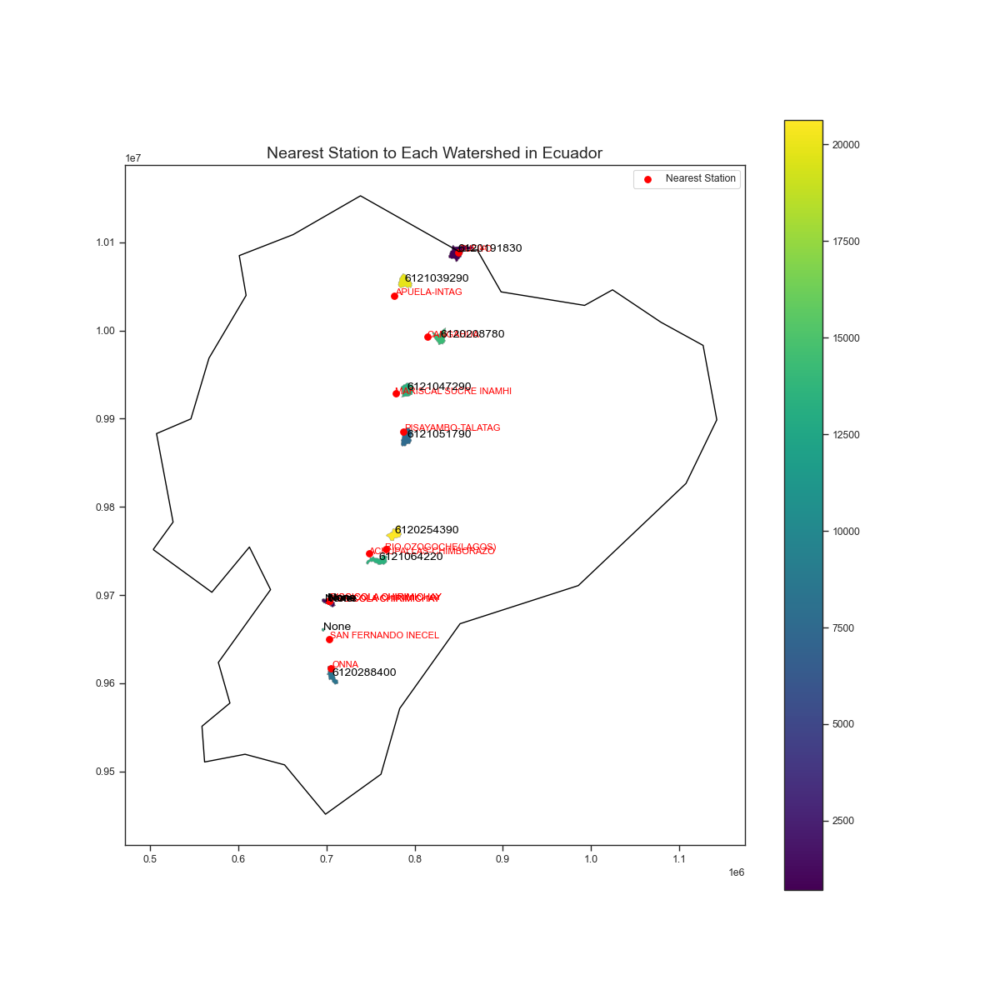

In [81]:
fig, ax = plt.subplots(figsize=(12, 12))

# Ecuador boundary
ecuador.boundary.to_crs(watersheds_utm.crs).plot(ax=ax, color='black', linewidth=1)

# Watersheds colored by distance
watersheds_with_stations.plot(
    ax=ax,
    column="distance_to_station_m",
    cmap="viridis",
    legend=True,
    edgecolor='grey',
    linewidth=0.3
)

# Nearest stations (one per basin)
nearest_stations_coords = stations_utm.loc[watersheds_with_stations["nearest_station_id"]].reset_index(drop=True)
nearest_stations_coords.plot(ax=ax, color="red", markersize=30, label="Nearest Station")

for i, row in nearest_stations_coords.iterrows():
    print(f"station {i}: {row['NAME']} with ID {row['ID']}")
    print(f"basin {watersheds_with_stations.loc[i]['HYBAS_ID_s']} \n")
    # Alternate offsets: even indices shift right/up, odd shift left/down
    dx = 1000 if i % 2 == 0 else -1000  # meters in x
    dy = 1000 if i % 2 == 0 else -1000  # meters in y
    ax.text(
        row.geometry.x + dx,
        row.geometry.y + dy,
        row["NAME"],
        fontsize=8,
        color='red'
    )


# Add basin names using HYBAS_ID_s
for idx, row in watersheds_with_stations.iterrows():
    centroid = row.geometry.centroid
    ax.text(
        centroid.x,
        centroid.y,
        str(row["HYBAS_ID_s"]),
        fontsize=10,
        color='black'
    )

# Set aspect and title
ax.set_aspect('equal')
ax.set_title("Nearest Station to Each Watershed in Ecuador", fontsize=14)
plt.legend()
plt.show()


In [82]:
Soil_moisture_sites

['Zhurucay',
 'Quinuas',
 '6120191830',
 '6120208780',
 '6120254390',
 '6120288400',
 '6121039290',
 '6121047290',
 '6121051790',
 '6121064220']

### basin 3: 6120191830

Weekly and monthly both not working

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269EB7AF210>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6120191830   No. Observations:                  115
Model:                                  random trend   Log Likelihood                 258.583
                   + stochastic freq_seasonal(12(1))   AIC                           -507.166
                                             + AR(2)   BIC                           -493.618
Date:                               Fri, 31 Oct 2025   HQIC                          -501.670
Time:                                       11:50:33                                         
Sample:                                   03-31-2015                                         
                                        - 09-30-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

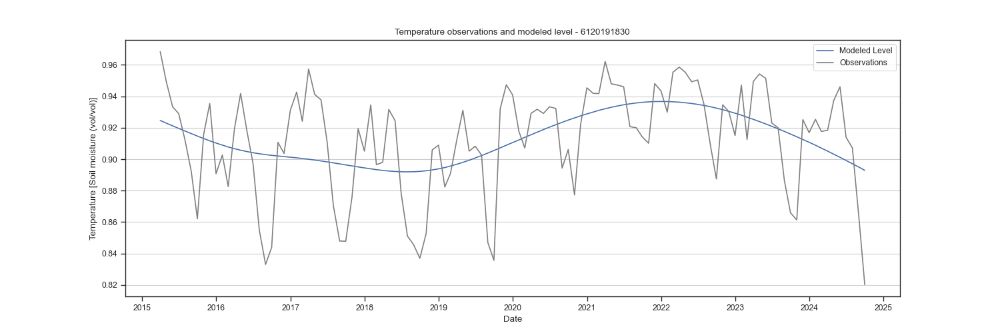

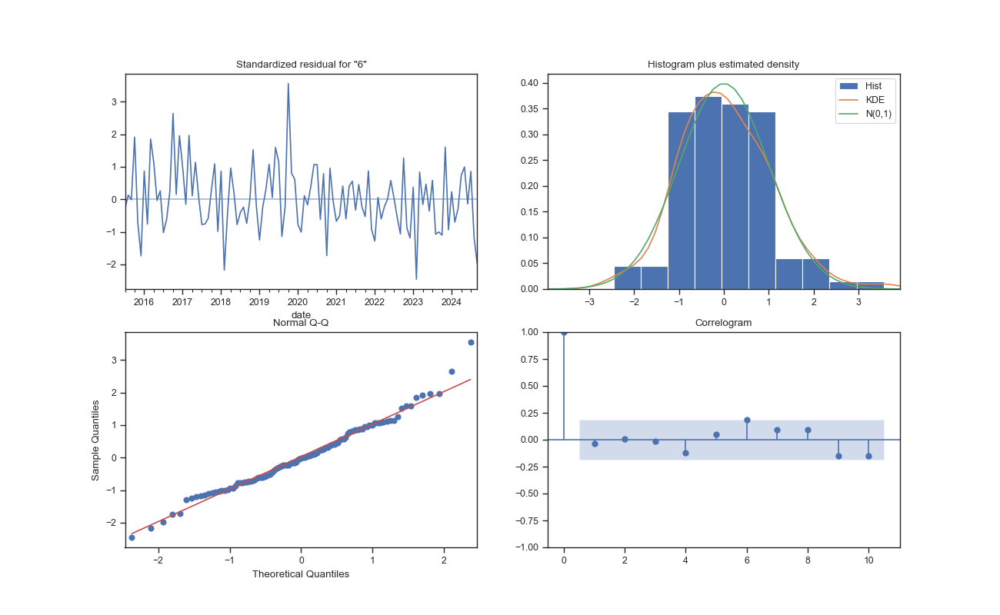

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x000002699B81E250>


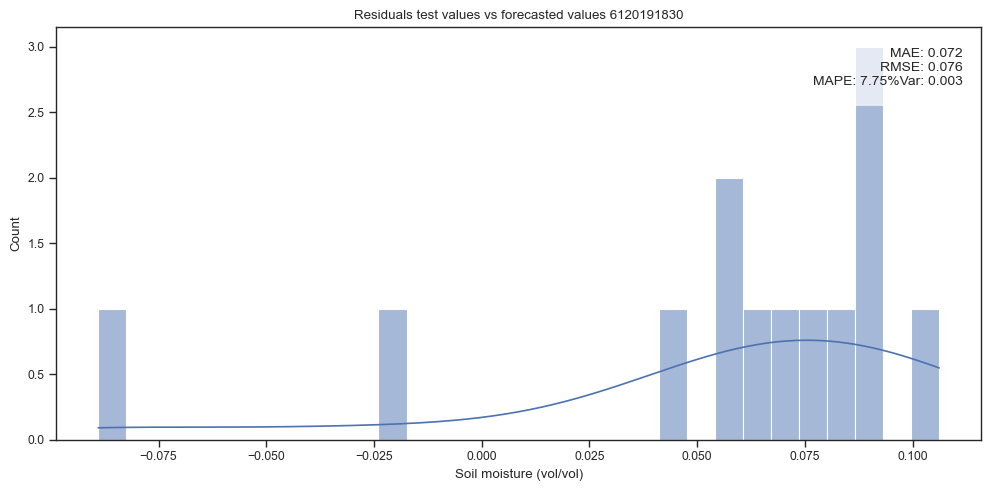

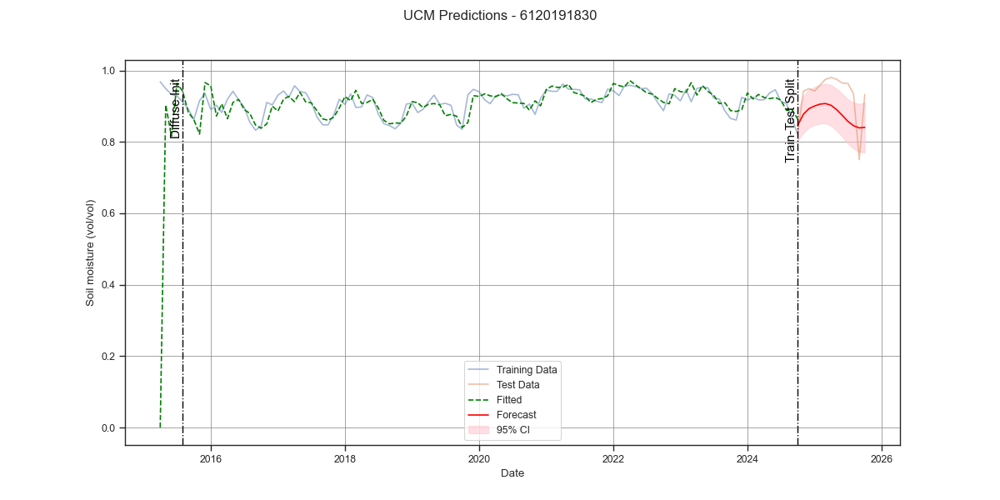

In [83]:
importlib.reload(UCM)

basin_3_train = analysis_overview['Soil_moisture']['6120191830']['train']
basin_3_train = basin_3_train.resample('ME').mean()
basin_3_test = analysis_overview['Soil_moisture']['6120191830']['test']
basin_3_test = basin_3_test.resample('ME').mean()

model_SM_basin3 = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':True,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1}],
    'autoregressive':2
} 

model_SM_basin3 = UCM.UnobservedComponentsModel(train_data= basin_3_train,
                              model_settings= model_SM_basin3,
                              station='6120191830',
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_3_test)

fit_forecast_model('6120191830', model_SM_basin3, analysis_overview)

### basin 4: 6120208780

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269BEAEAAD0>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6120208780   No. Observations:                  495
Model:                               fixed intercept   Log Likelihood                1447.939
                   + stochastic freq_seasonal(52(1))   AIC                          -2889.879
                                             + AR(1)   BIC                          -2877.283
Date:                               Fri, 31 Oct 2025   HQIC                         -2884.933
Time:                                       11:50:53                                         
Sample:                                   04-05-2015                                         
                                        - 09-22-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

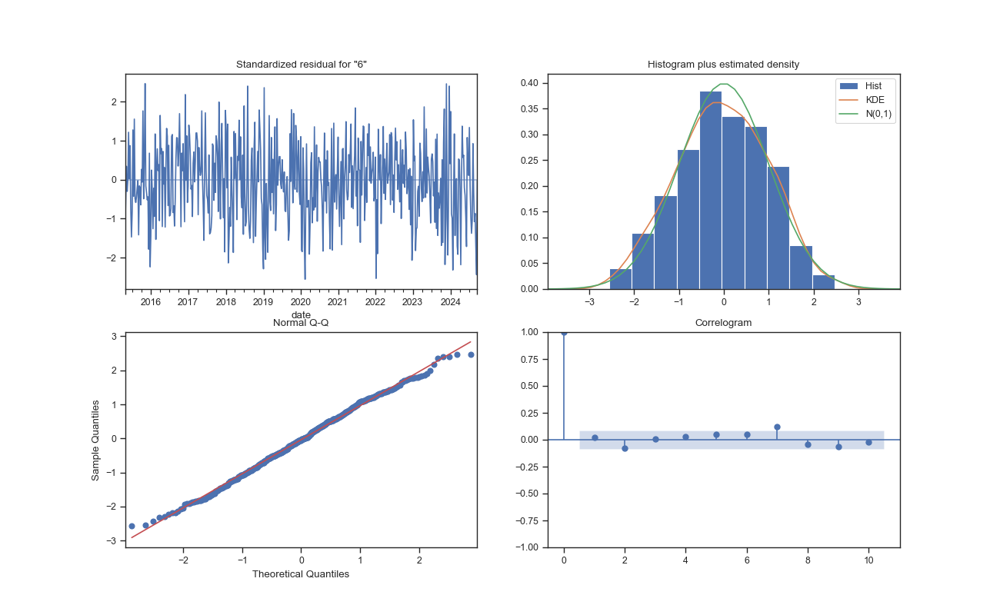

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x000002699C345290>


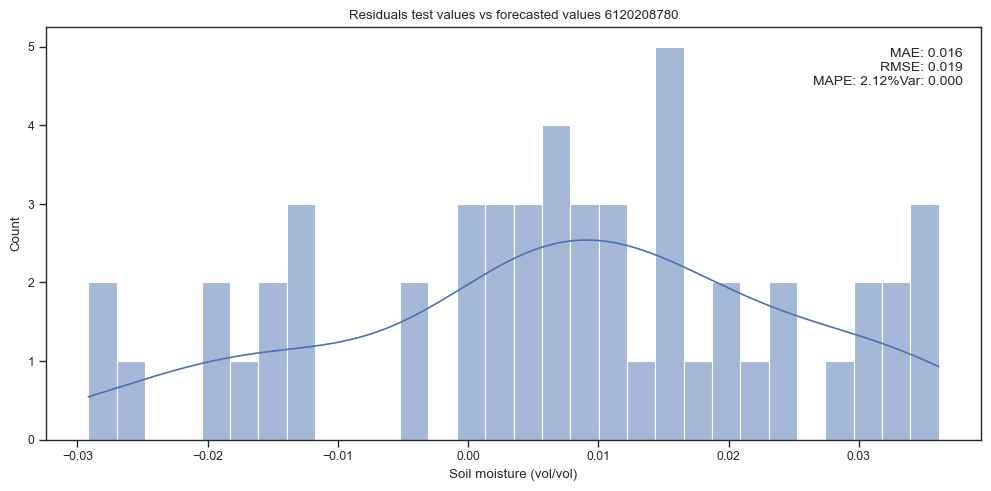

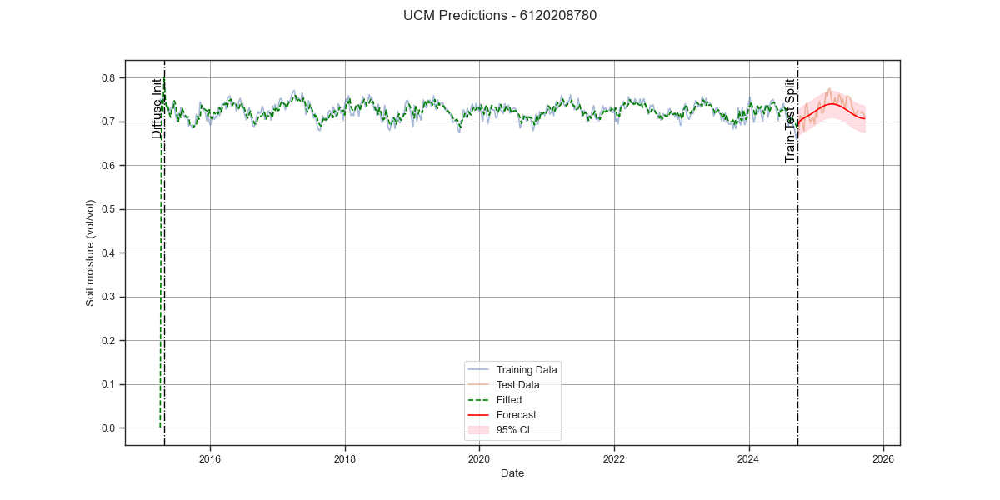

In [84]:
importlib.reload(UCM)

basin_4_train = analysis_overview['Soil_moisture']['6120208780']['train']
basin_4_train = basin_4_train.resample('W').mean()
basin_4_test = analysis_overview['Soil_moisture']['6120208780']['test']
basin_4_test = basin_4_test.resample('W').mean()

model_SM_4 = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":52,"harmonics":1}],
    'stochastic_freq_seasonal':[True],                 
    'autoregressive':1
} 

model_SM_4 = UCM.UnobservedComponentsModel(train_data= basin_4_train,
                                            model_settings= model_SM_4,
                                            station='6120208780',
                                            unit='Soil moisture (vol/vol)',
                                            test_data= basin_4_test)

fit_forecast_model('6120208780',model_SM_4, analysis_overview)


### basin 5: 6120254390

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x000002699F04BD50>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6120254390   No. Observations:                  115
Model:                                          None   Log Likelihood                 356.052
                   + stochastic freq_seasonal(12(1))   AIC                           -706.104
                                             + AR(1)   BIC                           -697.975
Date:                               Fri, 31 Oct 2025   HQIC                          -702.806
Time:                                       11:51:00                                         
Sample:                                   03-31-2015                                         
                                        - 09-30-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

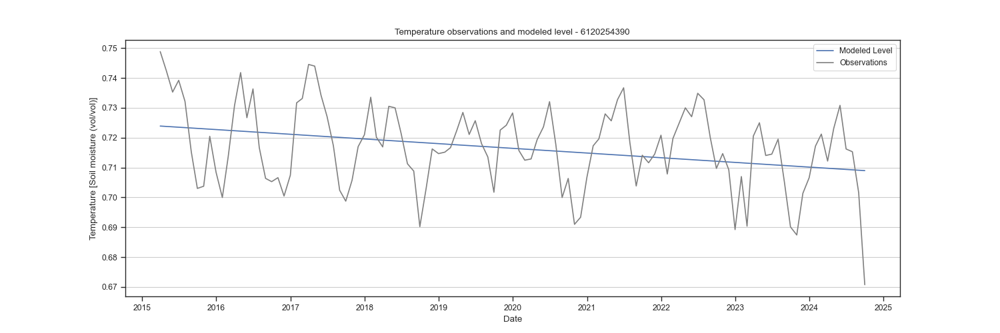

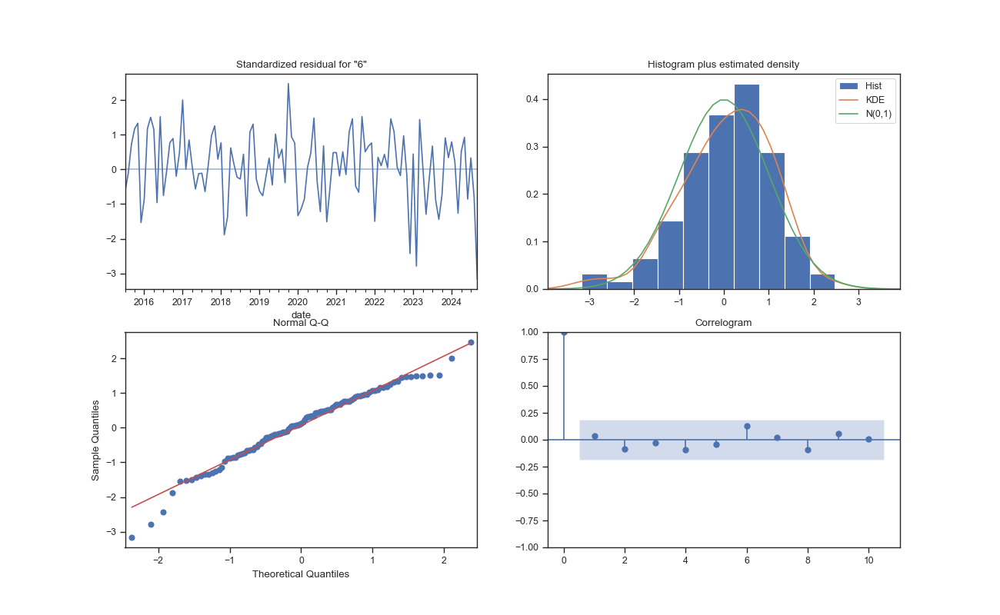

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x000002699F16D290>


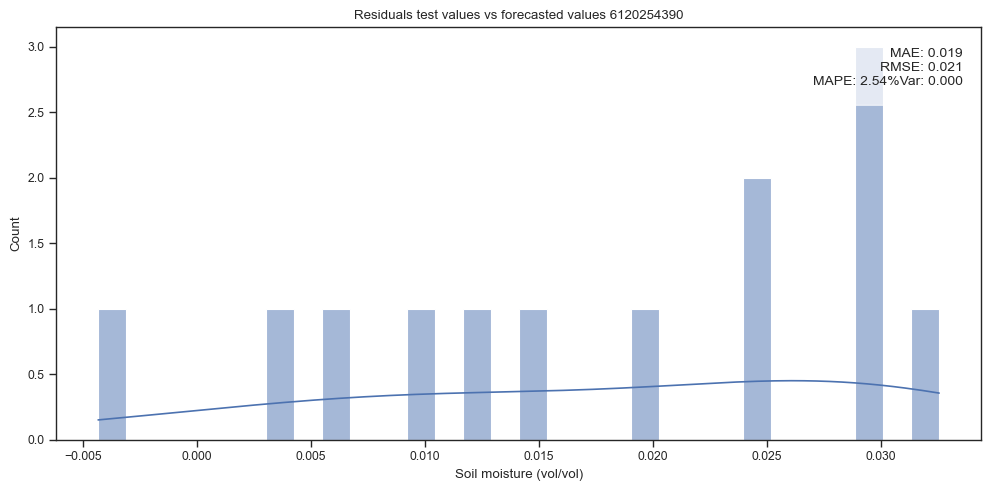

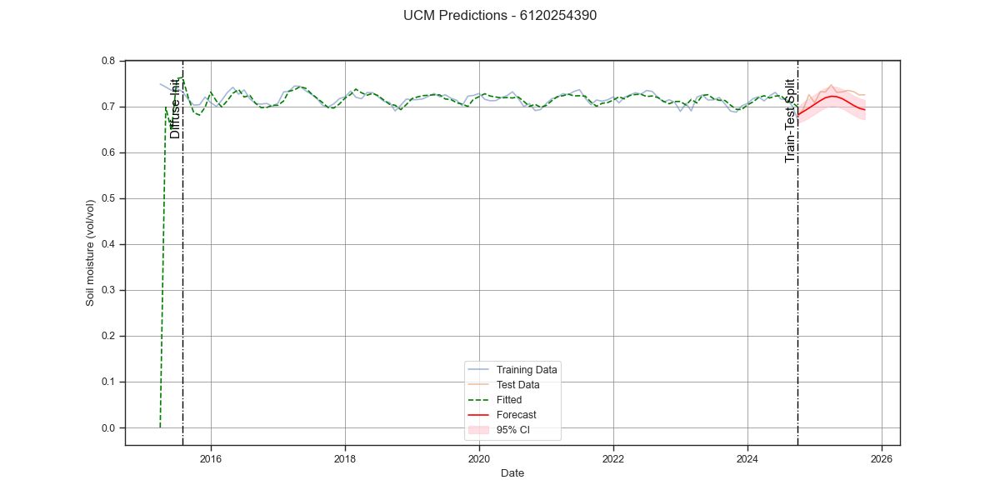

In [85]:
importlib.reload(UCM)

basin_5_train = analysis_overview['Soil_moisture']['6120254390']['train']
basin_5_train = basin_5_train.resample('ME').mean()
basin_5_test = analysis_overview['Soil_moisture']['6120254390']['test']
basin_5_test = basin_5_test.resample('ME').mean()

model_SM_basin5 = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1}],
    'stochastic_freq_seasonal':[True],
    'autoregressive':1
}

model_SM_5 = UCM.UnobservedComponentsModel(train_data= basin_5_train,
                              model_settings= model_SM_basin5,
                              station='6120254390',
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_5_test)

fit_forecast_model('6120254390',model_SM_5, analysis_overview)


### basin 6: 6120288400

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269A3ED2F10>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)
c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                Unobserved Components Results                                
Dep. Variable:                            6120288400   No. Observations:                  115
Model:                               fixed intercept   Log Likelihood                 308.074
                   + stochastic freq_seasonal(12(1))   AIC                           -610.148
                                             + AR(1)   BIC                           -601.992
Date:                               Fri, 31 Oct 2025   HQIC                          -606.839
Time:                                       11:51:06                                         
Sample:                                   03-31-2015                                         
                                        - 09-30-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

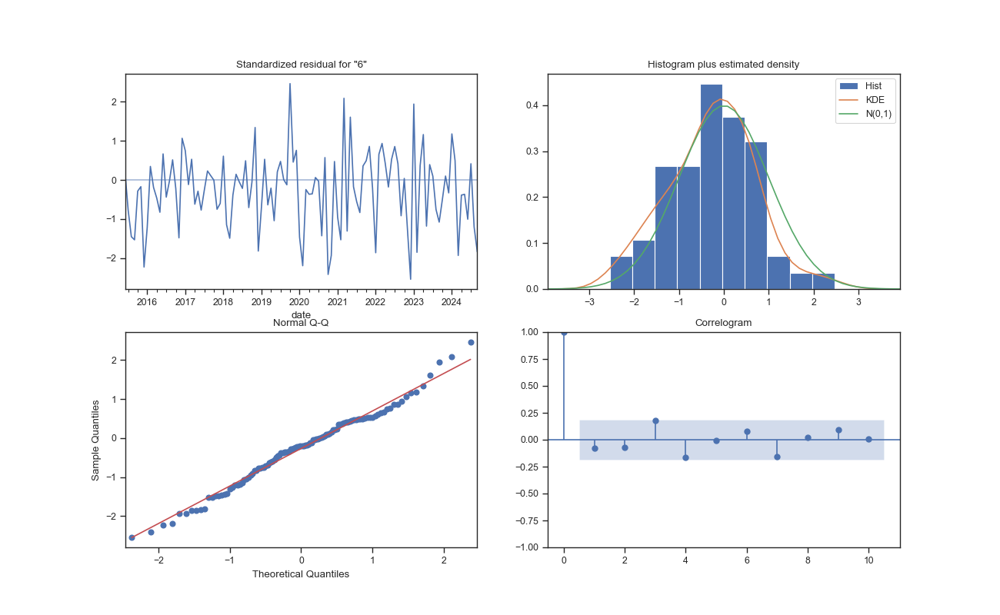

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x00000269A06B6250>


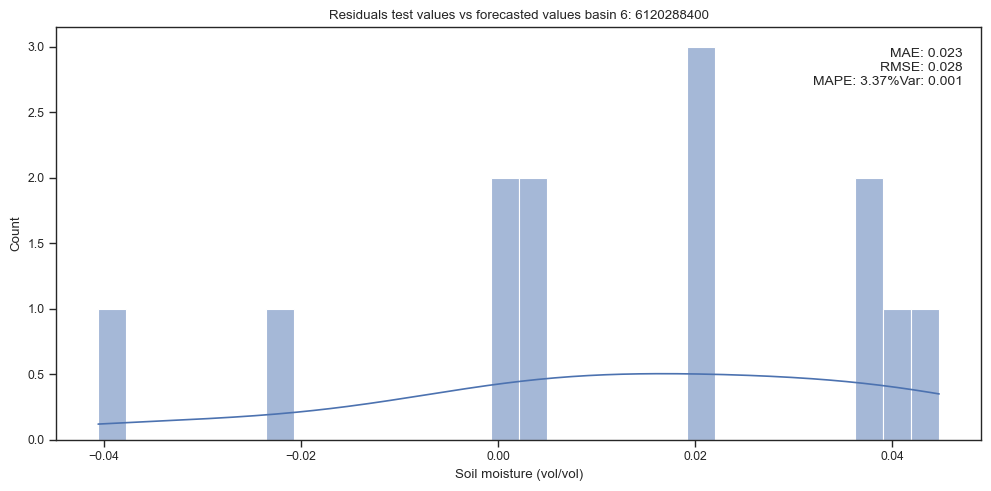

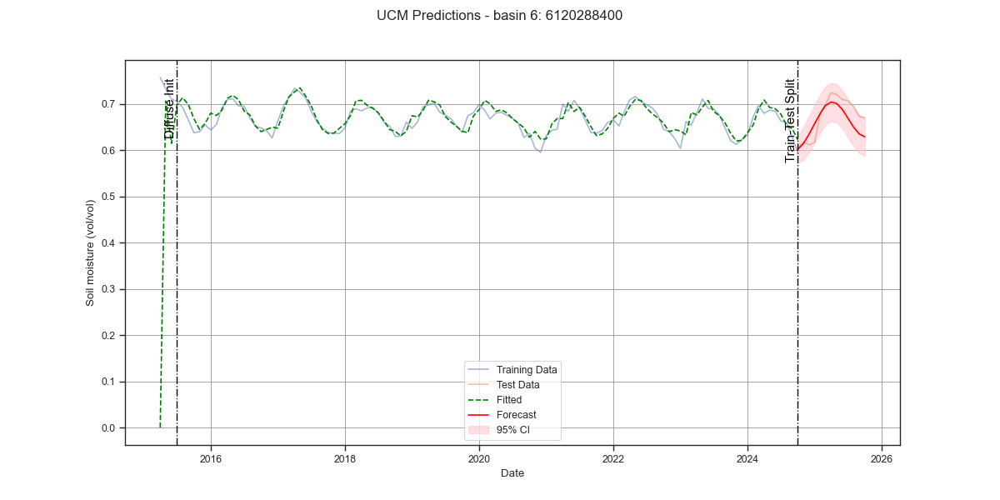

In [86]:
importlib.reload(UCM)

basin_6_train = analysis_overview['Soil_moisture']['6120288400']['train']
basin_6_train = basin_6_train.resample('ME').mean()
basin_6_test = analysis_overview['Soil_moisture']['6120288400']['test']
basin_6_test = basin_6_test.resample('ME').mean()

model_SM_basin6 = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1}],
    'autoregressive':1
} 

model_SM_6 = UCM.UnobservedComponentsModel(train_data= basin_6_train,
                              model_settings= model_SM_basin6,
                              station='basin 6: 6120288400',                              
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_6_test)

fit_forecast_model('6120288400',model_SM_6, analysis_overview)

### basin 7: 6121039290

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269CCF09010>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6121039290   No. Observations:                  495
Model:                               fixed intercept   Log Likelihood                1428.250
                   + stochastic freq_seasonal(52(1))   AIC                          -2850.500
                                             + AR(1)   BIC                          -2837.905
Date:                               Fri, 31 Oct 2025   HQIC                         -2845.554
Time:                                       11:51:16                                         
Sample:                                   04-05-2015                                         
                                        - 09-22-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

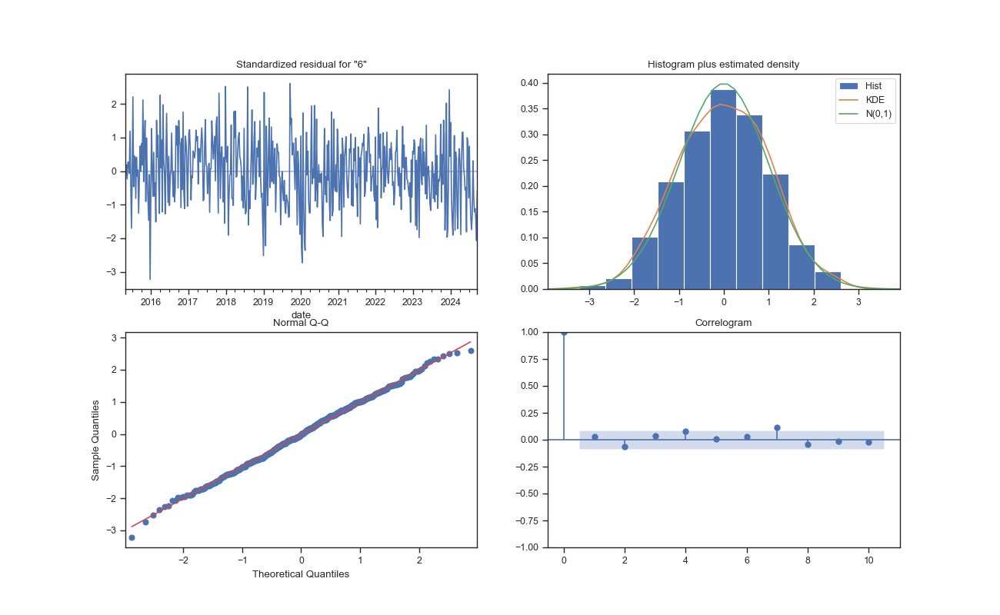

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x00000269A4CE3F90>


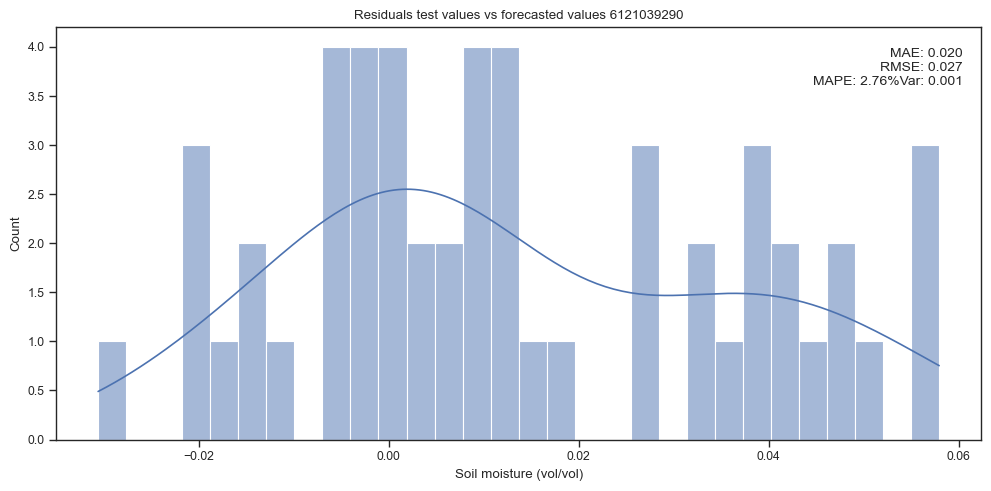

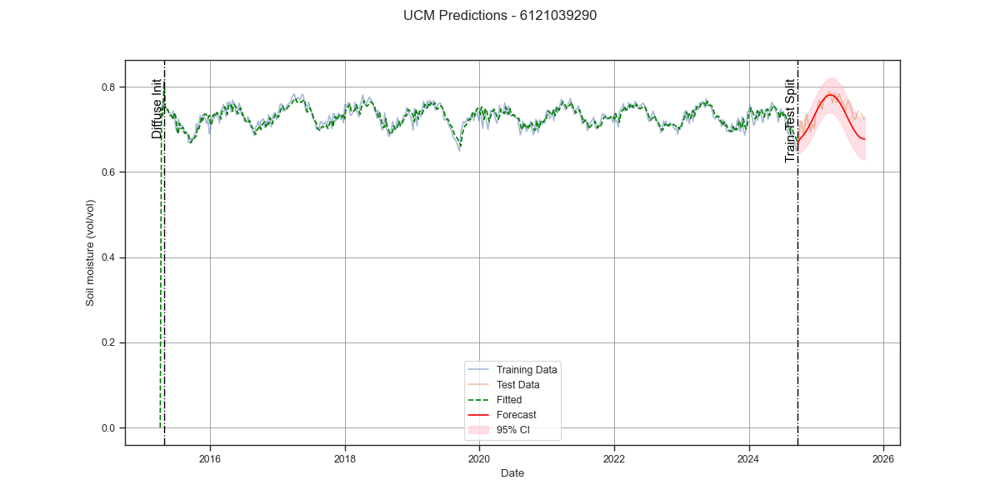

In [87]:
importlib.reload(UCM)

basin_7_train = analysis_overview['Soil_moisture']['6121039290']['train']
basin_7_train = basin_7_train.resample('W').mean()
basin_7_test = analysis_overview['Soil_moisture']['6121039290']['test']
basin_7_test = basin_7_test.resample('W').mean()

model_SM_basin7 = {
    'level': True,
    'stochastic_level':False,
    'trend':False,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":52,"harmonics":1}],
    'autoregressive':1
} 

model_SM_basin7 = UCM.UnobservedComponentsModel(train_data= basin_7_train,
                              model_settings= model_SM_basin7,
                              station='6121039290',
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_7_test)

fit_forecast_model('6121039290',model_SM_basin7, analysis_overview)


### basin 8: 6121047290

Model fails on daily data, not of weekly

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x0000026983758450>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6121047290   No. Observations:                  495
Model:                                          None   Log Likelihood                1444.948
                   + stochastic freq_seasonal(52(1))   AIC                          -2881.897
                                             + AR(2)   BIC                          -2865.111
Date:                               Fri, 31 Oct 2025   HQIC                         -2875.305
Time:                                       11:51:23                                         
Sample:                                   04-05-2015                                         
                                        - 09-22-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

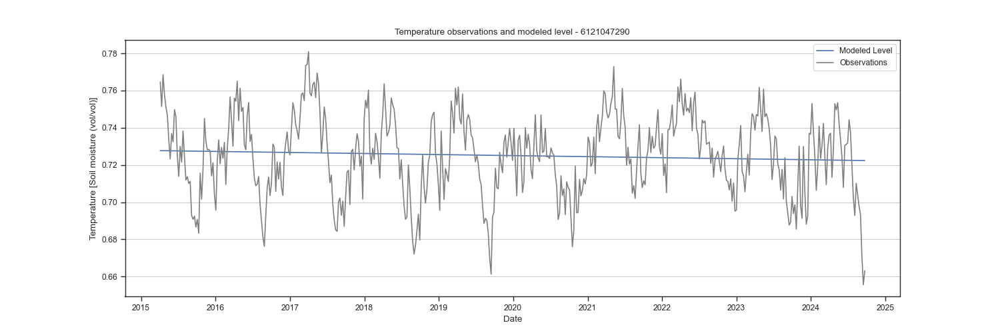

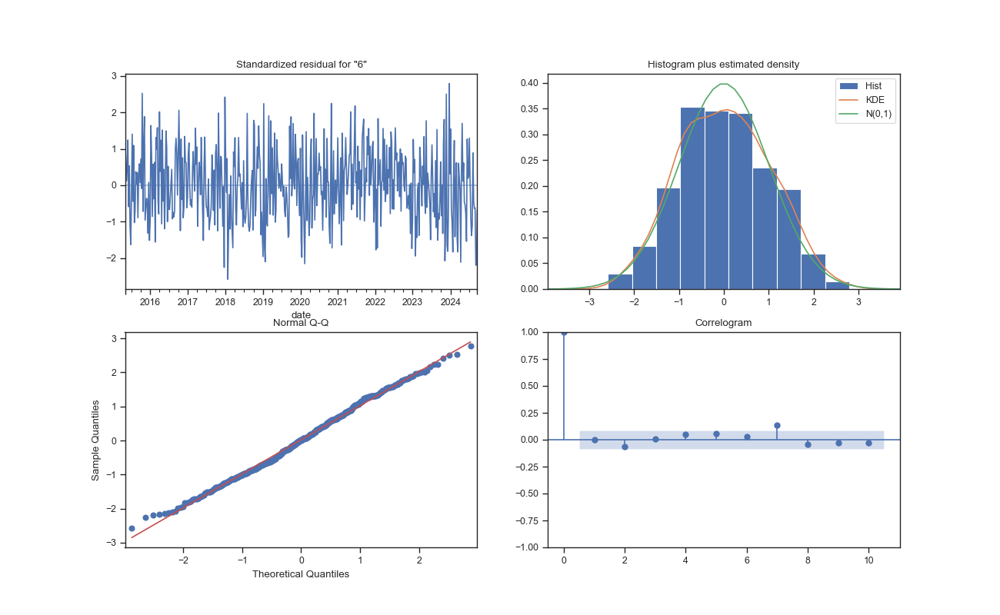

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x00000269A5A3E250>


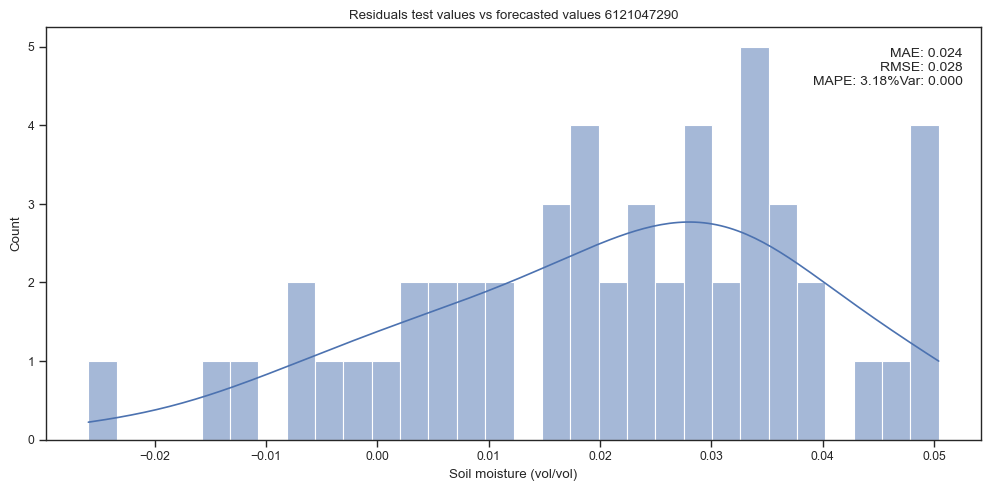

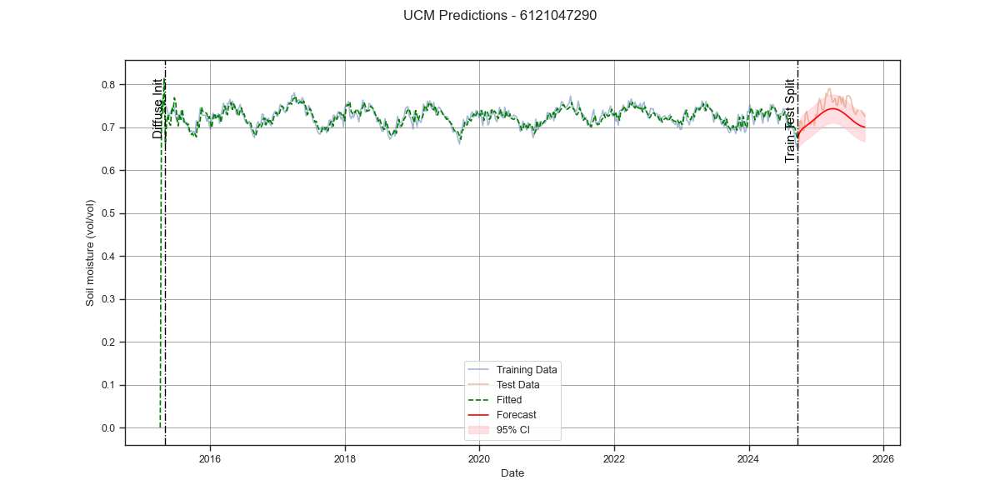

In [88]:
basin_8_train = analysis_overview['Soil_moisture']['6121047290']['train']
basin_8_train = basin_8_train.resample('W').mean()
basin_8_test = analysis_overview['Soil_moisture']['6121047290']['test']
basin_8_test = basin_8_test.resample('W').mean()

importlib.reload(UCM)

model_SM_basin8 = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":52,"harmonics":1}],
    'autoregressive':2
} 

model_SM_basin8 = UCM.UnobservedComponentsModel(train_data= basin_8_train,
                              model_settings= model_SM_basin8,
                              station='6121047290',
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_8_test)

fit_forecast_model('6121047290',model_SM_basin8, analysis_overview)

### basin 9: 6121051790

Daily and weekly mean failed, Monthly works. Best model:

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269A9456210>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6121051790   No. Observations:                  115
Model:                                  random trend   Log Likelihood                 337.207
                   + stochastic freq_seasonal(12(1))   AIC                           -666.413
                                             + AR(1)   BIC                           -655.575
Date:                               Fri, 31 Oct 2025   HQIC                          -662.016
Time:                                       11:51:29                                         
Sample:                                   03-31-2015                                         
                                        - 09-30-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

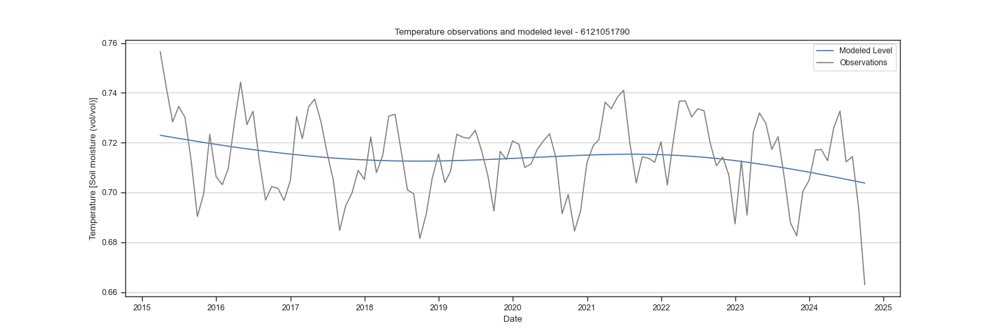

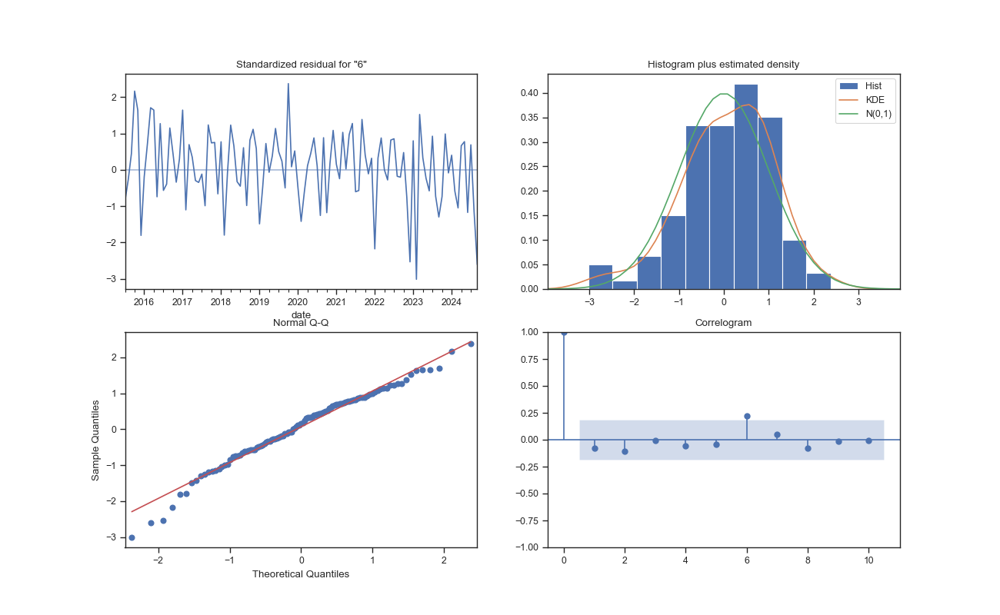

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x00000269AB62E250>


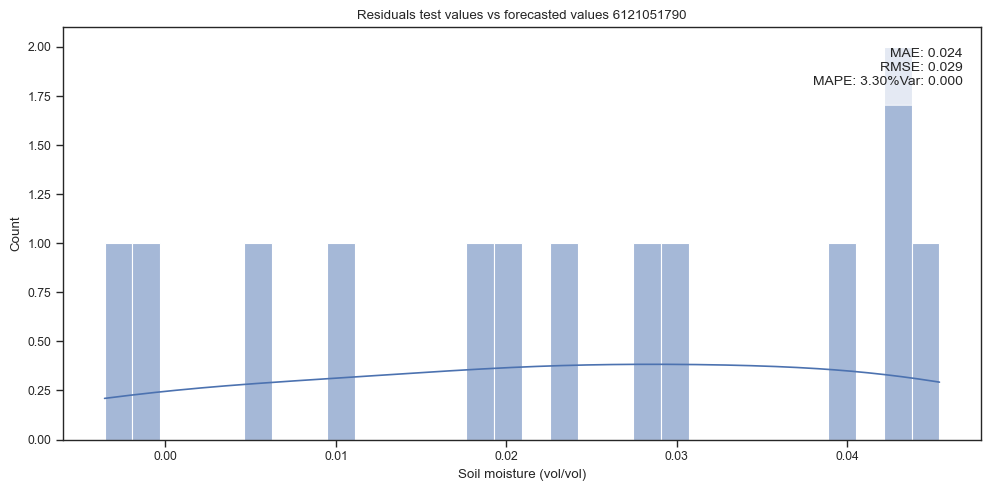

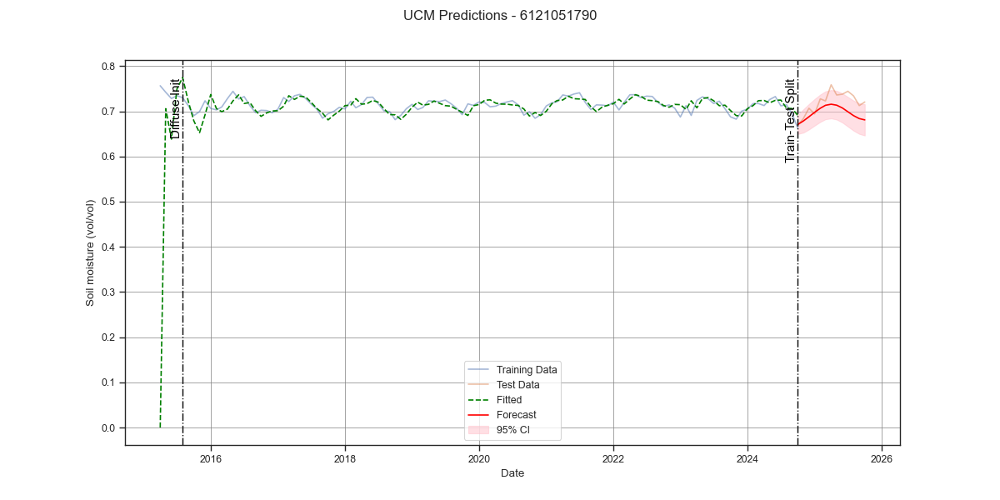

In [89]:
basin_9_train = analysis_overview['Soil_moisture']['6121051790']['train']
basin_9_train = basin_9_train.resample('ME').mean()
basin_9_test = analysis_overview['Soil_moisture']['6121051790']['test']
basin_9_test = basin_9_test.resample('ME').mean()

model_SM_basin9 = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':True,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1,'stochastic':False}],
    'autoregressive':1
} 

Quin_SM_model = UCM.UnobservedComponentsModel(train_data= basin_9_train,
                              model_settings= model_SM_basin9,
                              station='6121051790',
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_9_test)

fit_forecast_model('6121051790',Quin_SM_model, analysis_overview)

### basin 10: 6121064220

Daily and weekly data do not pass test but monthly does. Best model:

model_SM_basin10 = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':True,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1,'stochastic':True}],
    'autoregressive':1
} 

model: <statsmodels.tsa.statespace.structural.UnobservedComponents object at 0x00000269FFF6AF10>


c:\Users\mathi\miniconda3\envs\MDP-extreme-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


                                Unobserved Components Results                                
Dep. Variable:                            6121064220   No. Observations:                  115
Model:                                          None   Log Likelihood                 350.342
                   + stochastic freq_seasonal(12(1))   AIC                           -694.683
                                             + AR(1)   BIC                           -686.555
Date:                               Fri, 31 Oct 2025   HQIC                          -691.386
Time:                                       11:51:35                                         
Sample:                                   03-31-2015                                         
                                        - 09-30-2024                                         
Covariance Type:                                 opg                                         
                                 coef    std err          z 

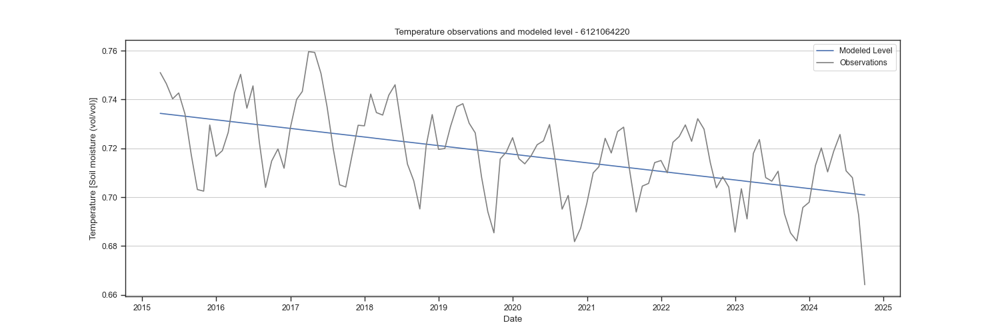

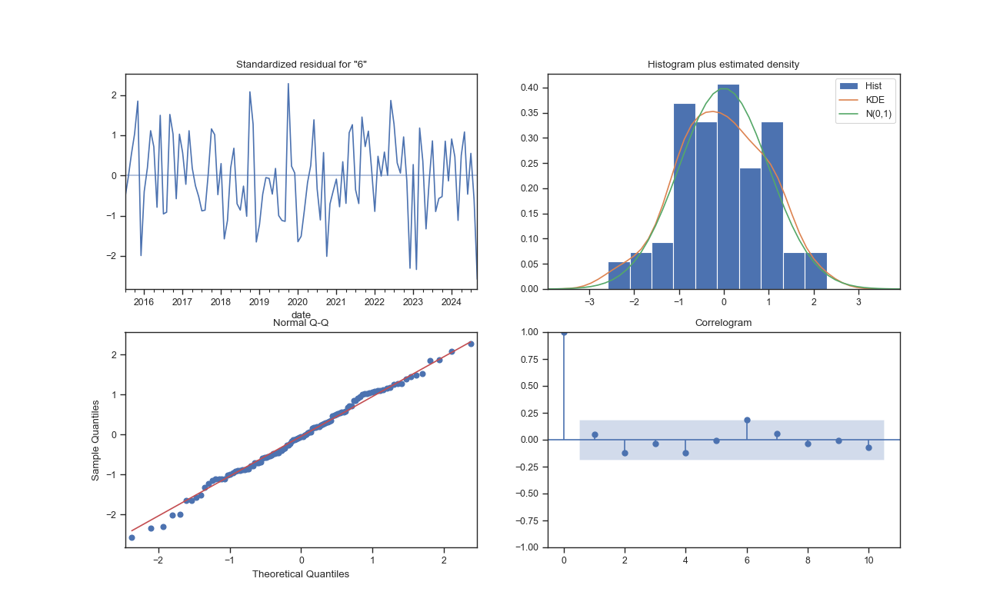

results: <statsmodels.tsa.statespace.structural.UnobservedComponentsResultsWrapper object at 0x00000269AB6DAB50>


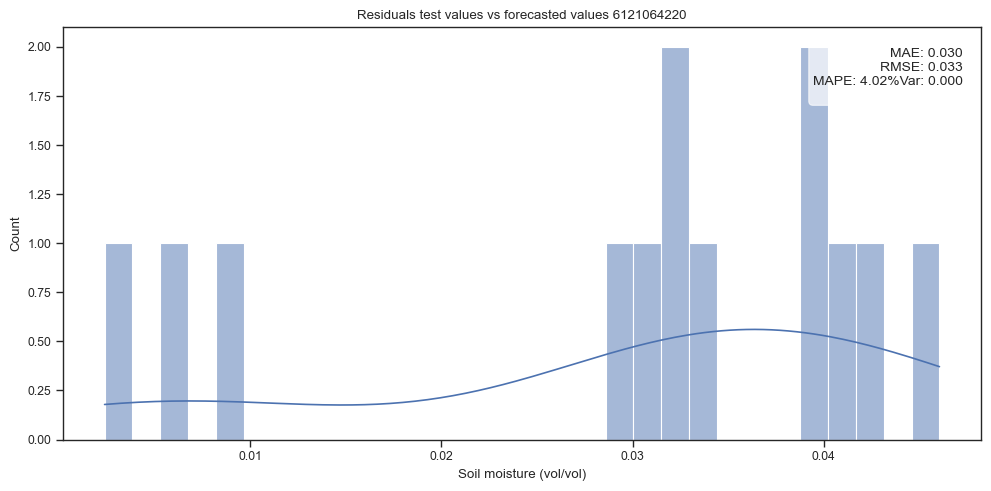

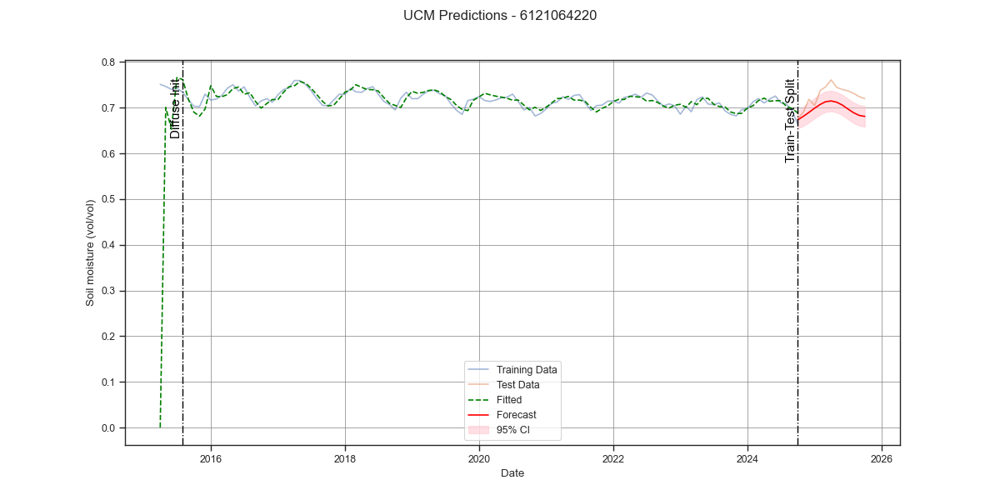

In [90]:
basin_10_train = analysis_overview['Soil_moisture']['6121064220']['train']
basin_10_train = basin_10_train.resample('ME').mean()
basin_10_test = analysis_overview['Soil_moisture']['6121064220']['test']
basin_10_test = basin_10_test.resample('ME').mean()

model_SM_basin10 = {
    'level': True,
    'stochastic_level':False,
    'trend':True,
    'stochastic_trend':False,
    'cycle':False,
    'stochastic_cycle':False,
    'freq_seasonal':[{"period":12,"harmonics":1,'stochastic':True}],
    'autoregressive':1
} 

model_SM_basin10 = UCM.UnobservedComponentsModel(train_data= basin_10_train,
                              model_settings= model_SM_basin10,
                              station='6121064220',
                              unit='Soil moisture (vol/vol)',
                              test_data= basin_10_test)

fit_forecast_model('6121064220',model_SM_basin10, analysis_overview)


In [91]:
analysis_overview

{'Soil_moisture': {'Zhurucay': {'raw': date
   2015-03-30    0.744870
   2015-03-31    0.742096
   2015-04-01    0.729469
   2015-04-02    0.728038
   2015-04-03    0.722891
                   ...   
   2025-09-13    0.657157
   2025-09-14    0.644897
   2025-09-15    0.637784
   2025-09-16    0.640900
   2025-09-17    0.659045
   Name: Zhurucay, Length: 3825, dtype: float64,
   'train_period': [Timestamp('2015-03-30 00:00:00'),
    Timestamp('2024-09-17 00:00:00')],
   'test_period': [Timestamp('2024-09-18 00:00:00'),
    Timestamp('2025-09-17 00:00:00')],
   'train': date
   2015-03-30    0.744870
   2015-03-31    0.742096
   2015-04-01    0.729469
   2015-04-02    0.728038
   2015-04-03    0.722891
                   ...   
   2024-09-13    0.558049
   2024-09-14    0.554755
   2024-09-15    0.558237
   2024-09-16    0.595232
   2024-09-17    0.588061
   Name: Zhurucay, Length: 3460, dtype: float64,
   'test': date
   2024-09-18    0.576554
   2024-09-19    0.569871
   2024-09-20   

In [92]:
analysis_overview['Soil_moisture']['Zhurucay']['model_performance']

{'JB_pval': np.float64(0.8813788445893895),
 'Q_pval': np.float64(0.07648082332121049),
 'H_pval': np.float64(0.18765119881510184)}

In [61]:
# --- Collect model-level summary statistics ---
model_summaries = []

for site, info in analysis_overview.items():
    model_perf = info['model_performance']
    model_perf = info.get('model_performance', {})
    model_settings = info.get('model_settings', {})

    # Skip if no model results
    if not model_perf:
        continue

    # --- Extract key metrics safely ---
    aic = model_perf.get('AIC', np.nan)
    bic = model_perf.get('BIC', np.nan)
    hqic = model_perf.get('HQIC', np.nan)
    llf = model_perf.get('Log-Likelihood', np.nan)

    # Diagnostic tests
    JB_pval = model_perf.get('JB_pval', np.nan)
    Q_pval = model_perf.get('Q_pval', np.nan)
    H_pval = model_perf.get('H_pval', np.nan)

    # Compute total score (direction-adjusted like before)
    directions = {"AIC": -1, "BIC": -1, "HQIC": -1, "Log-Likelihood": 1}
    adjusted_vals = [directions[k] * v for k, v in {
        "AIC": aic, "BIC": bic, "HQIC": hqic, "Log-Likelihood": llf
    }.items() if not np.isnan(v)]
    total_score = np.mean(adjusted_vals) if adjusted_vals else np.nan

    # --- Store model summary row ---
    model_summaries.append({
        'Site': site,
        'Model': model_settings.get('model_name', 'Unobserved Components'),
        'Level': model_settings.get('level', False),
        'Trend': model_settings.get('trend', False),
        'Stochastic_Trend': model_settings.get('stochastic_trend', False),
        'Seasonality': model_settings.get('freq_seasonal', None),
        'AR_order': model_settings.get('autoregressive', None),
        # 'AIC': aic,
        # 'BIC': bic,
        # 'HQIC': hqic,
        #'Log-Likelihood': llf,
        'JB_pval': JB_pval,
        'Q_pval': Q_pval,
        'H_pval': H_pval,
        #'Total_Score': total_score
    })

# --- Convert to DataFrame ---
model_summary_df = pd.DataFrame(model_summaries)
model_summary_df.set_index(['Site'], inplace=True)

print("\n=== Model Summary Table ===\n")
print(model_summary_df)


=== Model Summary Table ===

                            Model  Level  Trend  Stochastic_Trend  \
Site                                                                
Zhurucay    Unobserved Components   True  False             False   
Quinuas     Unobserved Components   True   True              True   
6120191830  Unobserved Components   True   True              True   
6120208780  Unobserved Components   True  False             False   
6120254390  Unobserved Components   True   True             False   
6120288400  Unobserved Components   True  False             False   
6121039290  Unobserved Components   True  False             False   
6121047290  Unobserved Components   True   True             False   
6121051790  Unobserved Components   True   True              True   
6121064220  Unobserved Components   True   True             False   

                                                  Seasonality  AR_order  \
Site                                                              

In [95]:
from scipy.stats import norm

def plot_residuals(variable):
    data = analysis_overview

    fig, axes = plt.subplots(1, 2, figsize=(13, 6))  # 1 row, 2 columns

    # === Training Residuals KDE ===
    for st, info in data[variable].items():
        residuals = info.get('train_residuals')
        if isinstance(residuals, pd.Series) and not residuals.empty:
            r = residuals.dropna()
            if r.nunique() > 1:
                sb.kdeplot(r, label=st, fill=True, alpha=0.3, ax=axes[0])
            else:
                print(f"⚠️ {st}: residuals constant, skipping KDE.")

    # Add reference normal distribution
    all_train_resid = pd.concat(
        [info.get('train_residuals').dropna() for info in data[variable].values() if isinstance(info.get('train_residuals'), pd.Series)]
    )
    mu, sigma = all_train_resid.mean(), all_train_resid.std()
    x = np.linspace(all_train_resid.min(), all_train_resid.max(), 300)
    #axes[0].plot(x, norm.pdf(x, mu, sigma), color='black', lw=2, linestyle='--', label='Normal(μ,σ) reference')

    axes[0].set_title("Training Data Residual Distributions (KDE)")
    axes[0].set_xlabel("Residual Value")
    axes[0].set_ylabel("Density")
    axes[0].legend()
    axes[0].grid(True, linestyle='--', alpha=0.7)

    # === Test Residuals KDE ===
    for st, info in data[variable].items():
        residuals = info.get('test_residuals')
        if isinstance(residuals, pd.Series) and not residuals.empty:
            r = residuals.dropna()
            if r.nunique() > 1:
                sb.kdeplot(r, label=st, fill=True, alpha=0.3, ax=axes[1])
            else:
                print(f"⚠️ {st}: residuals constant, skipping KDE.")

    # Add reference normal distribution for test data
    all_test_resid = pd.concat(
        [info.get('test_residuals').dropna() for info in data[variable].values() if isinstance(info.get('test_residuals'), pd.Series)]
    )
    mu_t, sigma_t = all_test_resid.mean(), all_test_resid.std()
    x_t = np.linspace(all_test_resid.min(), all_test_resid.max(), 300)
    #axes[1].plot(x_t, norm.pdf(x_t, mu_t, sigma_t), color='black', lw=2, linestyle='--', label='Normal(μ,σ) reference')

    axes[1].set_title("Test Data Residual Distributions (KDE)")
    axes[1].set_xlabel("Residual Value")
    axes[1].set_ylabel("Density")
    axes[1].legend()
    axes[1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

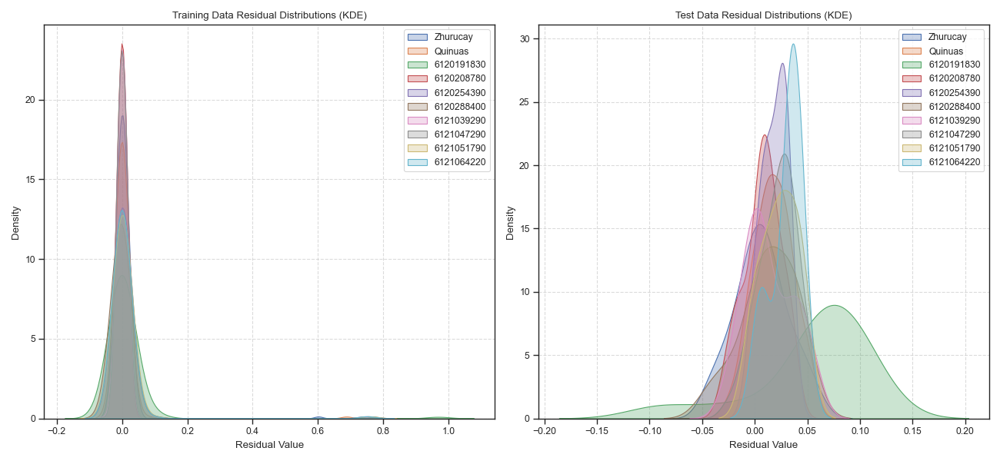

In [96]:
plot_residuals("Soil_moisture")